## Syntactic

### bigram_shift.txt
In this classification task the goal is to predict whether two consecutive tokens within the sentence have been inverted (label I for inversion and O for original).

The data was constructed by choosing two random consecutive tokens in the sentence, excluding beginning of sentence and punctuation marks. We also excluded sentences containing double quotes.

The task is called BShift in the paper.

In [1]:
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd
import csv

from datasets import Dataset, features

from llm_mri import ActivationAreas, Evaluation
from llm_mri.dimensionality_reduction import PCA, UMAP, SVD

In [7]:
# constants
RAW_DATASET_PATH = "../data/raw/"
INTERIM_DATASET_PATH = "../data/interim/"
PROCESSED_DATASET_PATH = "../data/processed/"
GRAPH_PATH = f"{INTERIM_DATASET_PATH}graphs/"
COMPLETE_GRAPH_PATH = f"{GRAPH_PATH}complete/"
FILTERED_GRAPH_PATH = f"{GRAPH_PATH}filtered/"
DATASETS_NAMES = ["bigram_shift", "odd_man_out", "sentence_length"]
# DATASETS_NAMES = ["bigram_shift_2_000", "odd_man_out_2_000", "sentence_length_2_000"]

model_ckpt = "bert-base-uncased"

# Run LLM-MRI and Save Graphs

In [3]:
labels = dict()
# for dataset_name in DATASETS_NAMES:
for dataset_name in  ["sentence_length"]:

    print(f"Processing dataset: {dataset_name}")
    # 1. Carregar o arquivo .txt (ajuste o caminho conforme necessário)
    # O separador costuma ser tabulação ou espaço, dependendo da versão
    df = pd.read_csv(
        f"{RAW_DATASET_PATH}{dataset_name}.txt",
        sep="\t",
        names=["split", "label", "text"],
        quoting=csv.QUOTE_NONE
    )

    print(f"Dataset '{dataset_name}' carregado com {len(df)} amostras.")

    # 2. Filtrar apenas o que você deseja (ex: apenas o split de treino 'tr')
    df = df.drop(columns=["split"])

    # 3. Criar o Dataset do Hugging Face (como feito no notebook Emotions.ipynb)
    dataset = Dataset.from_pandas(df.reset_index(drop=True))

    # 4. Mapear as labels para ClassLabel (essencial para o LLM-MRI)
    class_names = [str(x) for x in sorted(dataset.unique("label"))]
    labels[dataset_name] = class_names
    class_feature = features.ClassLabel(names=class_names)
    dataset = dataset.map(lambda x: {"label": class_feature.str2int(str(x["label"]))})
    dataset = dataset.cast(
        features.Features({"label": class_feature, "text": dataset.features["text"]})
    )

    # 5. Processar as áreas de ativação usando o LLM-MRI

    umap = UMAP(n_components=2, random_state=42, gridsize=15)
    llm_mri = ActivationAreas(
        model=model_ckpt, device="cpu", dataset=dataset, reduction_method=umap
    )
    llm_mri.process_activation_areas(
        # save_raw_path="data/dados_hf_brutos",
        # save_reduced_path="data/reduzidos.pt",
        save_jsonl_path=f"{INTERIM_DATASET_PATH}/{dataset_name}_features.json"
    )

    for label in class_names:
        current_graph = llm_mri.get_graph(label)
        nx.write_gexf(
            current_graph, f"{COMPLETE_GRAPH_PATH}/g_{label}_{dataset_name}.gexf"
        )

    total_graph = llm_mri.get_graph(class_names)
    nx.write_gexf(total_graph, f"{COMPLETE_GRAPH_PATH}/g_total_{dataset_name}.gexf")

Processing dataset: sentence_length
Dataset 'sentence_length' carregado com 9996 amostras.


Map:   0%|          | 0/9996 [00:00<?, ? examples/s]

Casting the dataset:   0%|          | 0/9996 [00:00<?, ? examples/s]

Map:   0%|          | 0/9996 [00:00<?, ? examples/s]

Map:   0%|          | 0/9996 [00:00<?, ? examples/s]

Saving raw features in extract_features format to: ../data/interim//sentence_length_features.json, length of dataset: 9996...
Exporting features in extract_features format to: ../data/interim//sentence_length_features.json...
JSONL file saved successfully!


/home/f-msc2026/ra256352/Documents/pos/code/master_degree_lab/venv/lib64/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/f-msc2026/ra256352/Documents/pos/code/master_degree_lab/venv/lib64/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/f-msc2026/ra256352/Documents/pos/code/master_degree_lab/venv/lib64/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/f-msc2026/ra256352/Documents/pos/code/master_degree_lab/venv/lib64/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/f-msc2026/ra256352/Documents/pos/code/master_degree_lab/venv/lib64/python3.13/site-packages/umap/u

### Show Graphs

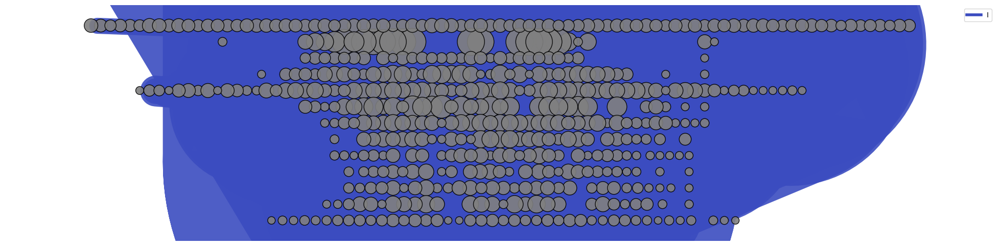

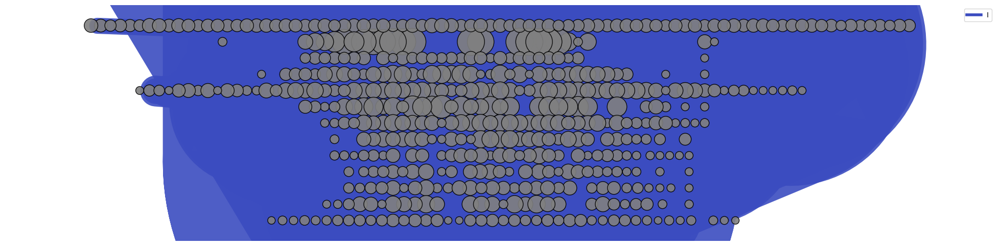

In [6]:
llm_mri.get_graph_image(g_I, fix_node_positions=True)

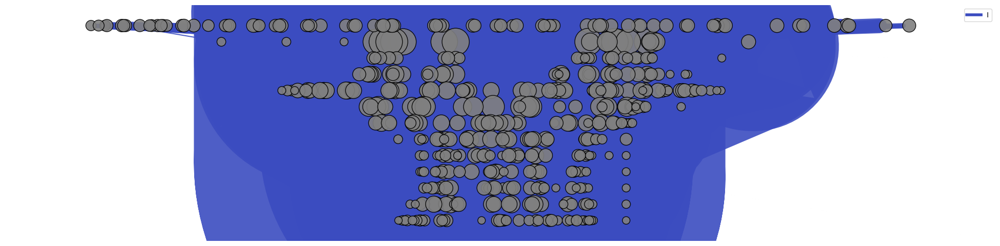

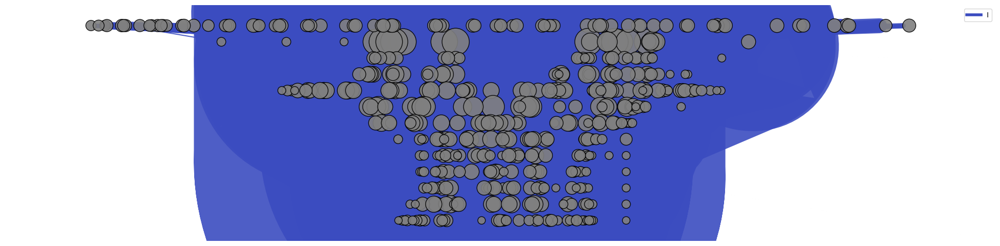

In [7]:
llm_mri.get_graph_image(g_I, fix_node_positions=False)


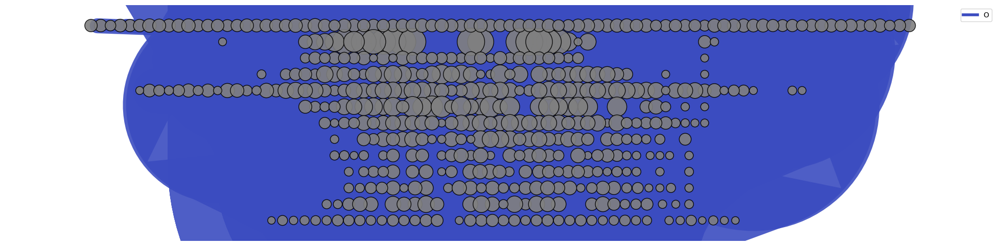

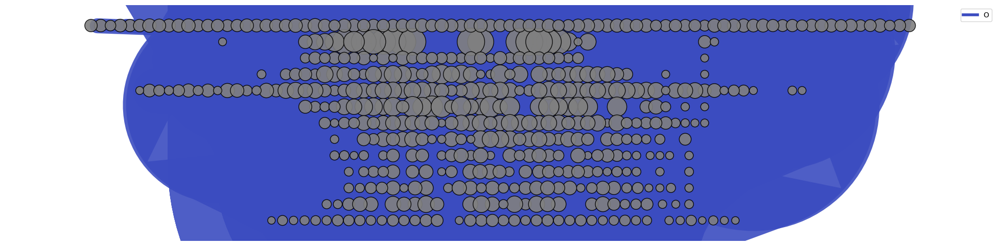

In [8]:
llm_mri.get_graph_image(g_O, fix_node_positions=True)

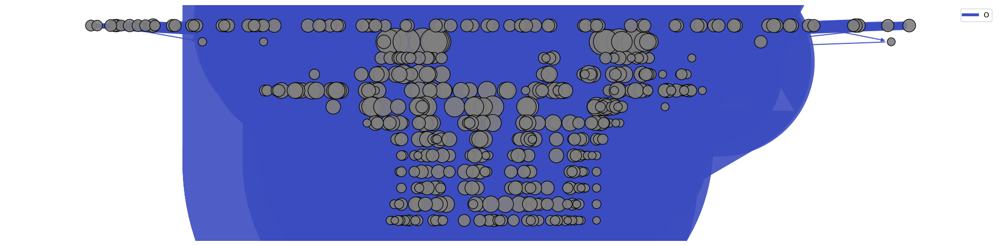

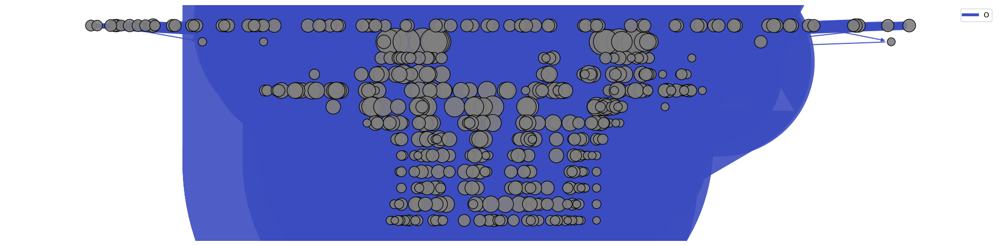

In [9]:
llm_mri.get_graph_image(g_O, fix_node_positions=False)


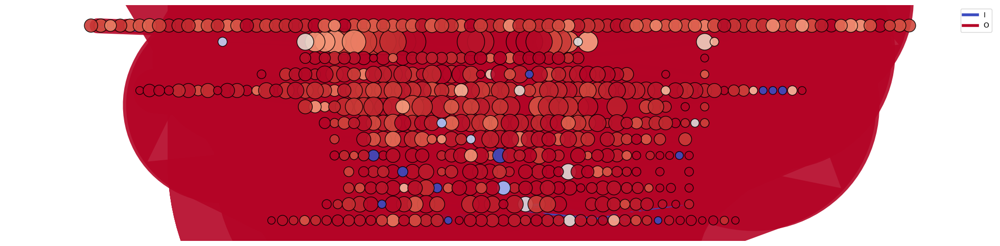

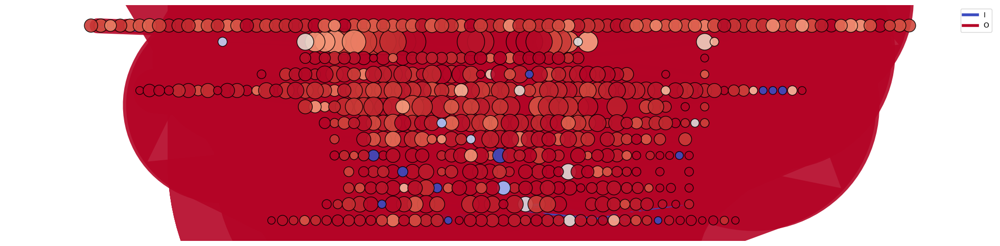

In [10]:
llm_mri.get_graph_image(g_total, fix_node_positions=True)


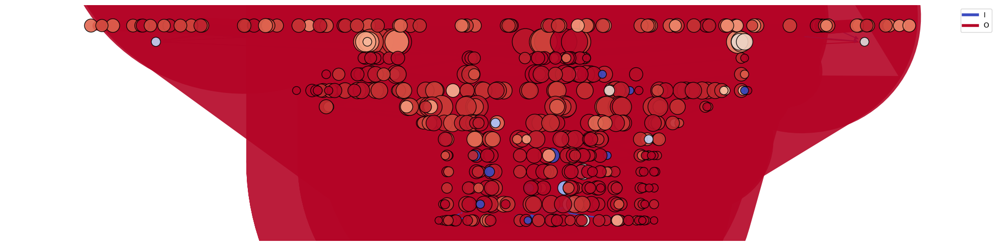

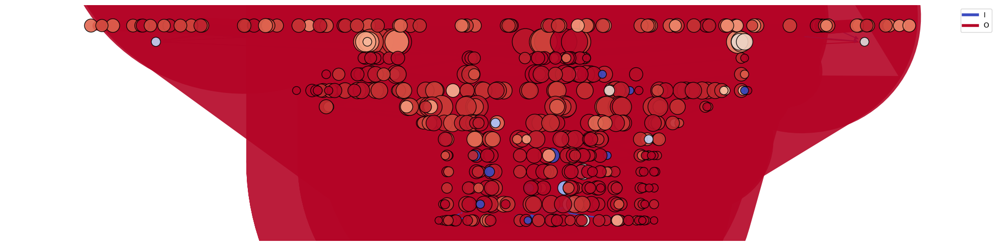

In [11]:
llm_mri.get_graph_image(g_total, fix_node_positions=False)


# Get Metrics by Layer

In [3]:
from functools import partial

def get_layer_number(node_name):
    return int(node_name.split("_")[0])

# Each cell represents an activation region, in the format hiddenstate_x_y
def get_x_coord(node_name):
    return int(node_name.split("_")[1])

def get_y_coord(node_name):
    return int(node_name.split("_")[2])

def get_edge_name(source, target):
    source_layer = get_layer_number(source)
    target_layer = get_layer_number(target)
    
    if source_layer < target_layer:
        return f"{source_layer}>>{target_layer}"
    return f"{target_layer}>>{source_layer}"

def merge_data_from_dicts(d1, d2):
    all_keys = d1.keys() | d2.keys()

    d2_value_type = type(list(d2.values())[0])
    if d2_value_type is list:
        return {k: [*d1.get(k, []), *d2.get(k, [])] for k in all_keys}
    
    return {k: [*d1.get(k, []), d2.get(k, 0)] for k in all_keys}


def get_degree_per_layer(graph, return_mean=True):
    degree_per_layer = dict()
    current_graph_degree = graph.degree()
    for node, degree in current_graph_degree:
        layer = get_layer_number(node)
        if layer in degree_per_layer:
            degree_per_layer[layer].append(degree)
        else:
            degree_per_layer[layer] = [degree]
    if return_mean:
        degree_per_layer = {k: np.mean(v) for k, v in degree_per_layer.items()}
    return degree_per_layer

def get_num_nodes_per_layer(graph):
    nodes_per_layer = dict()
    for node in graph.nodes():
        layer = get_layer_number(node)
        if layer in nodes_per_layer:
            nodes_per_layer[layer] += 1
        else:
            nodes_per_layer[layer] = 1
    return nodes_per_layer

def get_num_edges_per_layer(graph):
    edges_per_layer = dict()
    for source, target in graph.edges():
        edge_name = get_edge_name(source, target)
        if edge_name in edges_per_layer:
            edges_per_layer[edge_name] += 1
        else:
            edges_per_layer[edge_name] = 1
    return edges_per_layer

def get_node_betweenness_per_layer(graph, normalized=True, return_mean=True):
    betweenness_per_layer = dict()

    general_betweenness = nx.betweenness_centrality(graph, normalized=normalized)
    for node, betweenness in general_betweenness.items():
        layer = get_layer_number(node)
        if layer in betweenness_per_layer:
            betweenness_per_layer[layer].append(betweenness)
        else:
            betweenness_per_layer[layer] = [betweenness]

    if return_mean:
        betweenness_per_layer = {k: np.mean(v) for k, v in betweenness_per_layer.items()}
    return betweenness_per_layer

def get_edge_betweenness_per_layer(graph, normalized=True, return_mean=True):
    betweenness_per_layer = dict()

    general_betweenness = nx.edge_betweenness_centrality(graph, normalized=normalized)
    for (source, target), betweenness in general_betweenness.items():
        layer = get_edge_name(source, target)
        if layer in betweenness_per_layer:
            betweenness_per_layer[layer].append(betweenness)
        else:
            betweenness_per_layer[layer] = [betweenness]

    if return_mean:
        betweenness_per_layer = {k: np.mean(v) for k, v in betweenness_per_layer.items()}
    return betweenness_per_layer

def get_node_strength_per_layer(graph, return_mean=True):
    strength_per_layer = dict()

    general_strength = graph.degree(weight='weight')
    for node, strength in general_strength:
        layer = get_layer_number(node)
        if layer in strength_per_layer:
            strength_per_layer[layer].append(strength)
        else:
            strength_per_layer[layer] = [strength]

    if return_mean:
        strength_per_layer = {k: np.mean(v) for k, v in strength_per_layer.items()}
    return strength_per_layer

def get_assortativity_per_layer(graph, return_mean=True):
    pass

def get_average_neighbor_degree_per_layer(graph, return_mean=True):
    avg_neighbor_degree_per_layer = dict()

    general_avg_neighbor_degree = nx.average_neighbor_degree(graph,  weight='weight')
    for node, avg_neighbor_degree in general_avg_neighbor_degree.items():
        layer = get_layer_number(node)
        if layer in avg_neighbor_degree_per_layer:
            avg_neighbor_degree_per_layer[layer].append(avg_neighbor_degree)
        else:
            avg_neighbor_degree_per_layer[layer] = [avg_neighbor_degree]

    if return_mean:
        avg_neighbor_degree_per_layer = {k: np.mean(v) for k, v in avg_neighbor_degree_per_layer.items()}
    return avg_neighbor_degree_per_layer

# https://www.notion.so/Centro-de-Massa-por-Camada-31ab046f0c2080998336d06c6f9f4d2c?source=copy_link
def get_center_of_mass_per_layer(graph, axl):
    # Formato: {camada: {"soma_massa_posicao": 0.0, "soma_massa": 0.0}}
    layer_accumulators = dict()

    # Seleciona a função correta de coordenadas com base no eixo ('x' ou 'y')
    pos_func = {"x": get_x_coord, "y": get_y_coord}[axl]
    
    general_strength = graph.degree(weight='weight')
    for node, strength in general_strength:
        pos = pos_func(node)
        layer = get_layer_number(node)
        
        if layer not in layer_accumulators:
            layer_accumulators[layer] = {"sum_mass_pos": 0.0, "sum_mass": 0.0}
        layer_accumulators[layer]["sum_mass_pos"] += (strength * pos)
        layer_accumulators[layer]["sum_mass"] += strength

    center_of_mass_per_layer = dict()
    
    for layer, data in layer_accumulators.items():
        if data["sum_mass"] > 0:
            cm = data["sum_mass_pos"] / data["sum_mass"]
        else:
            cm = 0.0
            
        center_of_mass_per_layer[layer] = cm
        
    return center_of_mass_per_layer



def get_metric_function(metric_name=None):
    metric_name_dict = {
        "degree_per_layer": get_degree_per_layer,
        "num_nodes_per_layer": get_num_nodes_per_layer,
        "num_edges_per_layer": get_num_edges_per_layer,
        "node_betweenness_per_layer": get_node_betweenness_per_layer,
        "edge_betweenness_per_layer": get_edge_betweenness_per_layer,
        "node_strength_per_layer":get_node_strength_per_layer,
        # TODO: implementar a assortatividade de duas a duas camadas
        # "assortativity_per_layer": get_assortativity_per_layer,
        "average_neighbor_degree": get_average_neighbor_degree_per_layer,
        "center_of_mass_x": partial(get_center_of_mass_per_layer, axl="x"),
        "center_of_mass_y": partial(get_center_of_mass_per_layer, axl="y"),
    }
    if metric_name is None:
        return metric_name_dict
    return metric_name_dict.get(metric_name)
    

In [4]:
def dict_to_dataframe(metrics_per_layer_dict):
  # Separando métricas por nó e por aresta
  node_metrics = {k: v for k, v in metrics_per_layer_dict.items() 
                  if 'edge' not in k}
  edge_metrics = {k: v for k, v in metrics_per_layer_dict.items() 
                  if 'edge' in k}

  # DataFrame de métricas por camada (nó)
  df_nodes = pd.DataFrame(node_metrics)
  df_nodes.index.name = 'layer'
  df_nodes = df_nodes.reset_index()

  # DataFrame de métricas por aresta entre camadas
  df_edges = pd.DataFrame(edge_metrics)
  df_edges.index.name = 'layer_pair'
  df_edges = df_edges.reset_index()

  # Extrair a camada inicial e criar identificador
  df_edges['layer'] = df_edges['layer_pair'].apply(lambda x: int(x.split('>>')[0]))

  # Renomear colunas de arestas
  edge_cols = {col: f'edge_{col}' for col in df_edges.columns if col != 'layer' and col != 'layer_pair'}
  df_edges = df_edges.rename(columns=edge_cols)

  # Fazer merge apenas mantendo layer e layer_pair
  df_combined = pd.merge(df_nodes, df_edges[['layer', 'layer_pair'] + list(edge_cols.values())], 
                        on='layer', how='left')

  # Criar coluna de descrição
  df_combined.insert(1, 'layer_description', 
                    df_combined.apply(lambda row: f"{row['layer']} ({row['layer_pair']})" 
                                      if pd.notna(row['layer_pair']) else str(row['layer']), axis=1))

  # Remover layer_pair se quiser
  return df_combined.drop('layer_pair', axis=1)

In [5]:
def filter_and_plot_edges(caminho_entrada, caminho_saida, threshold=1):
    try:
        print("============================================")
        print(f"Processando o grafo: {caminho_entrada}")
        G = nx.read_gexf(caminho_entrada)
        
        # 1. Coletar pesos originais
        pesos_antes = [d.get('weight', 1) for u, v, d in G.edges(data=True)]
        
        # 2. Identificar e remover arestas
        arestas_para_remover = [
            (u, v) for u, v, d in G.edges(data=True)
            if d.get('weight', 0) <= threshold
        ]
        
        G.remove_edges_from(arestas_para_remover)
        
        # 3. Coletar pesos depois (os que sobraram)
        pesos_depois = [d.get('weight', 1) for u, v, d in G.edges(data=True)]

        # 4. Gerar os Gráficos
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5), sharey=True)

        # Histograma Antes
        ax1.hist(pesos_antes, bins=30, color='skyblue', edgecolor='black')
        ax1.set_title(f'Antes do Filtro (Total: {len(pesos_antes)})')
        ax1.set_xlabel('Peso da Aresta')
        ax1.set_ylabel('Frequência')

        # Histograma Depois
        ax2.hist(pesos_depois, bins=30, color='salmon', edgecolor='black')
        ax2.set_title(f'Depois do Filtro (Total: {len(pesos_depois)})')
        ax2.set_xlabel('Peso da Aresta')

        plt.tight_layout()
        plt.show()

        # 5. Salvar o novo grafo
        nx.write_gexf(G, caminho_saida)
        print(f"Removidas {len(arestas_para_remover)} arestas.")
        print(f"Grafo salvo em: {caminho_saida}")
        
    except Exception as e:
        print(f"Erro ao processar o grafo: {e}")

Processando o grafo: ../data/interim/graphs/complete/g_I_bigram_shift.gexf


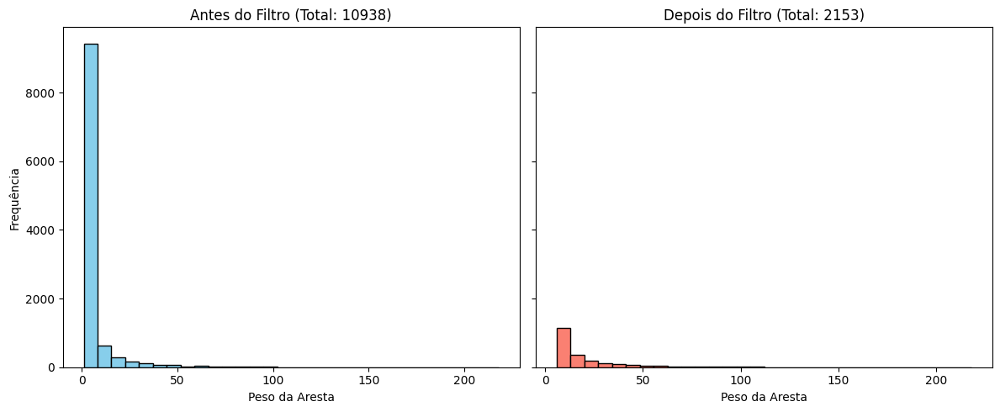

Removidas 8785 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_I_bigram_shift.gexf
Processando o grafo: ../data/interim/graphs/complete/g_O_bigram_shift.gexf


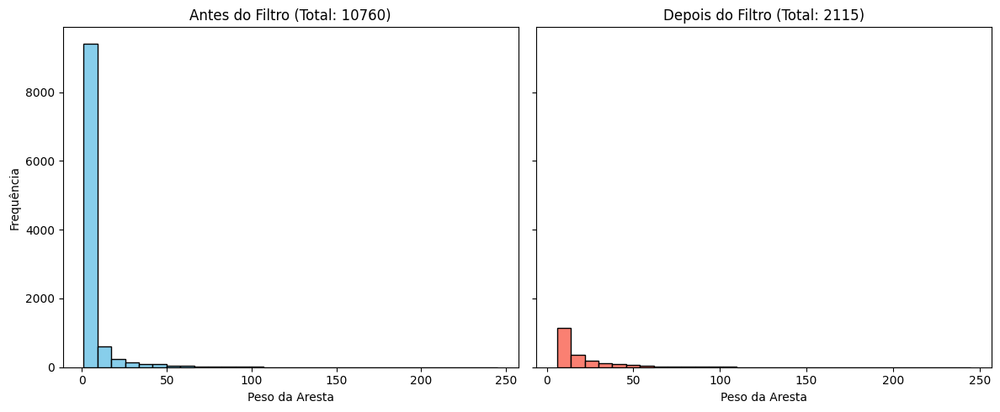

Removidas 8645 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_O_bigram_shift.gexf
Processando o grafo: ../data/interim/graphs/complete/g_total_bigram_shift.gexf


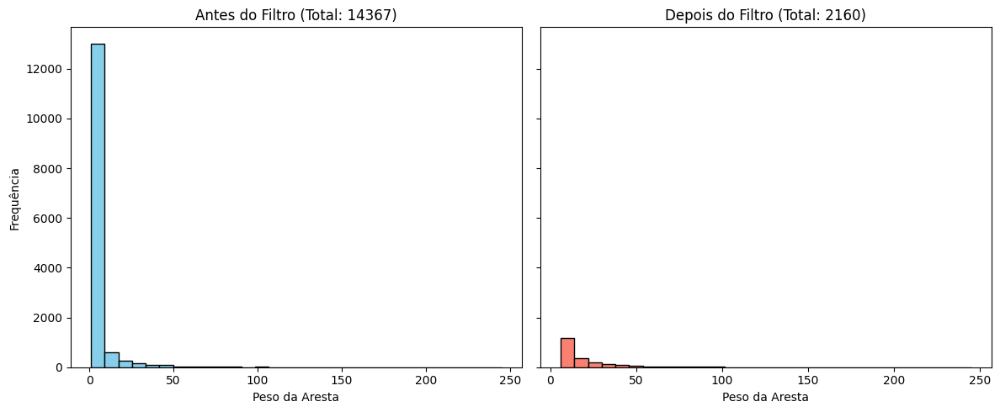

Removidas 12207 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_total_bigram_shift.gexf
Processando o grafo: ../data/interim/graphs/complete/g_C_odd_man_out.gexf


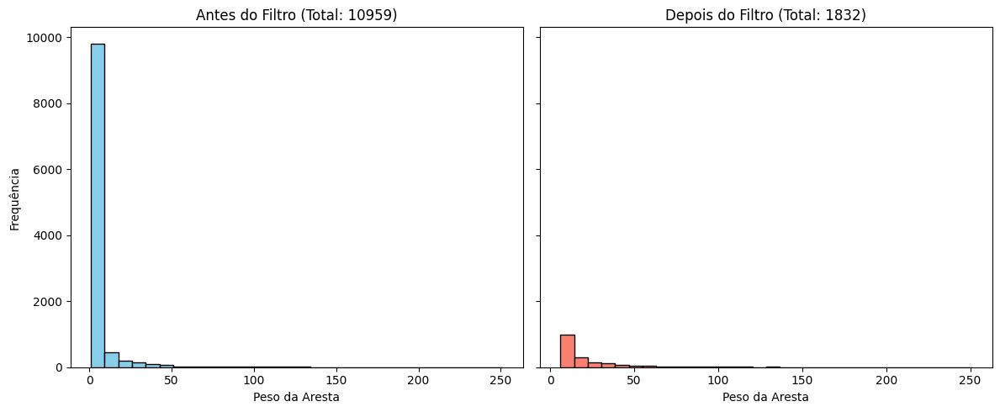

Removidas 9127 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_C_odd_man_out.gexf
Processando o grafo: ../data/interim/graphs/complete/g_O_odd_man_out.gexf


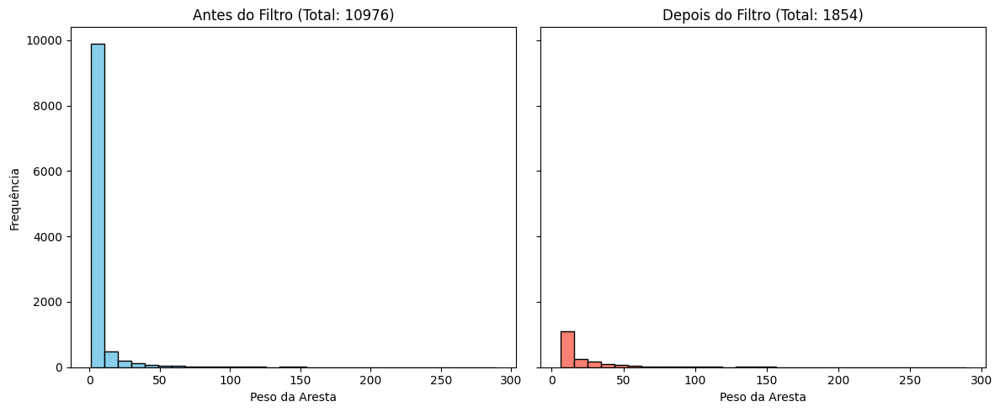

Removidas 9122 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_O_odd_man_out.gexf
Processando o grafo: ../data/interim/graphs/complete/g_total_odd_man_out.gexf


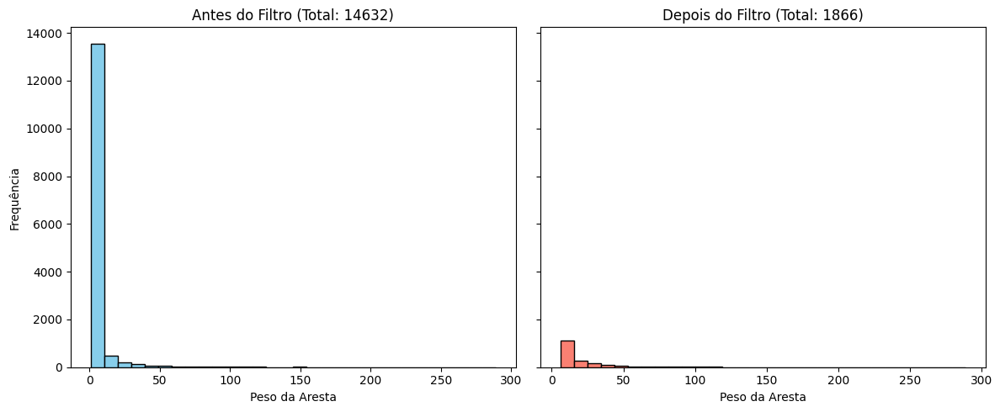

Removidas 12766 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_total_odd_man_out.gexf
Processando o grafo: ../data/interim/graphs/complete/g_0_sentence_length.gexf


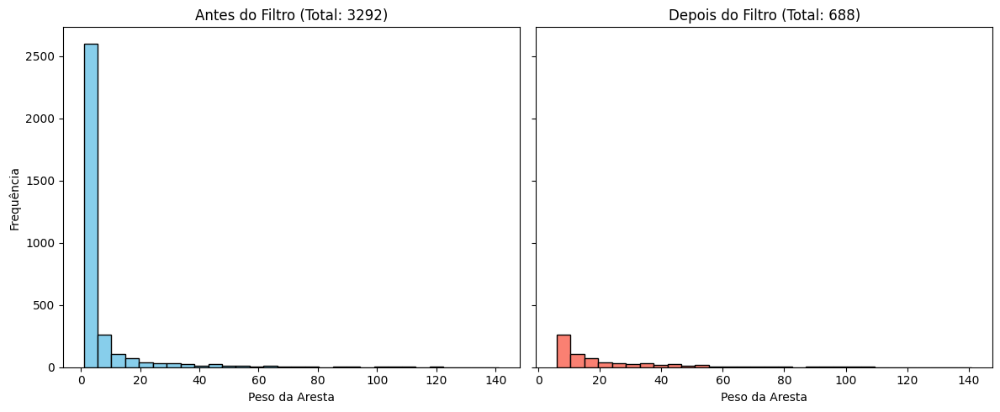

Removidas 2604 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_0_sentence_length.gexf
Processando o grafo: ../data/interim/graphs/complete/g_1_sentence_length.gexf


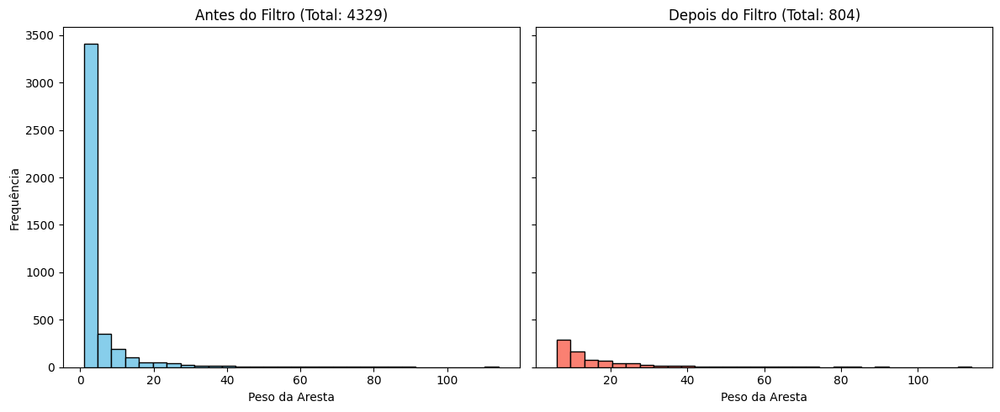

Removidas 3525 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_1_sentence_length.gexf
Processando o grafo: ../data/interim/graphs/complete/g_2_sentence_length.gexf


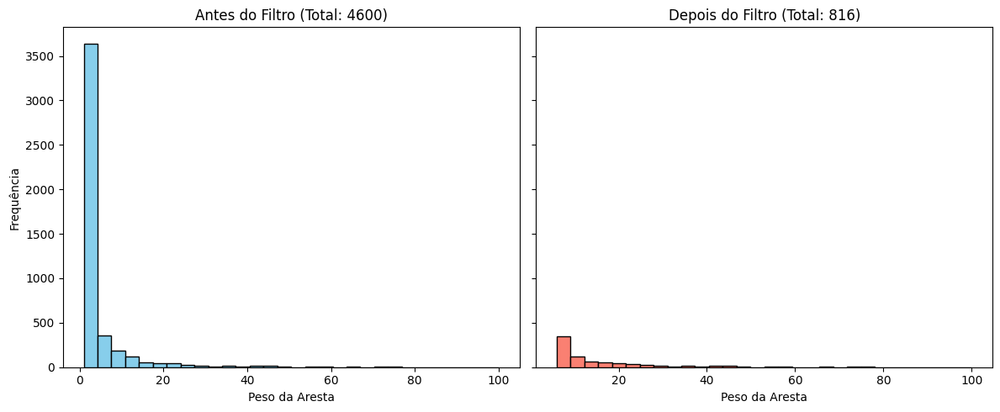

Removidas 3784 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_2_sentence_length.gexf
Processando o grafo: ../data/interim/graphs/complete/g_3_sentence_length.gexf


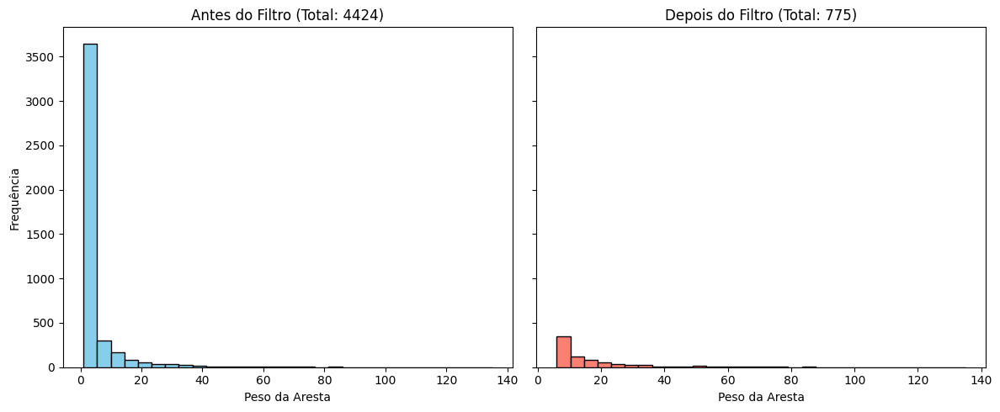

Removidas 3649 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_3_sentence_length.gexf
Processando o grafo: ../data/interim/graphs/complete/g_4_sentence_length.gexf


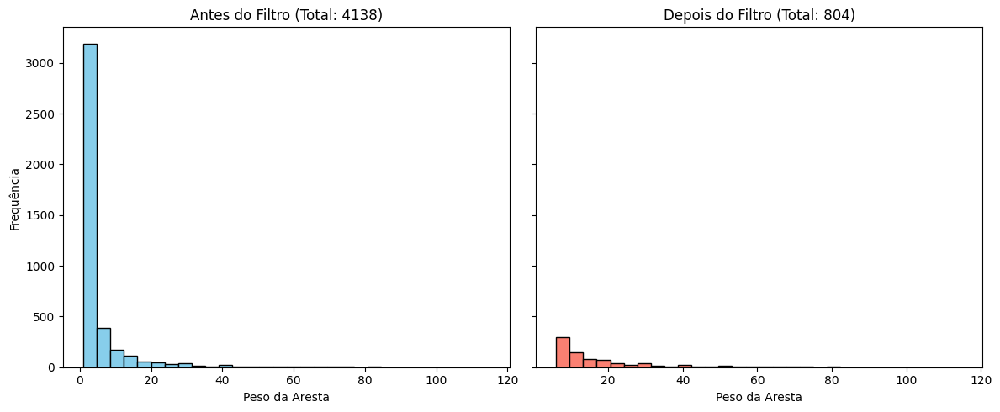

Removidas 3334 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_4_sentence_length.gexf
Processando o grafo: ../data/interim/graphs/complete/g_5_sentence_length.gexf


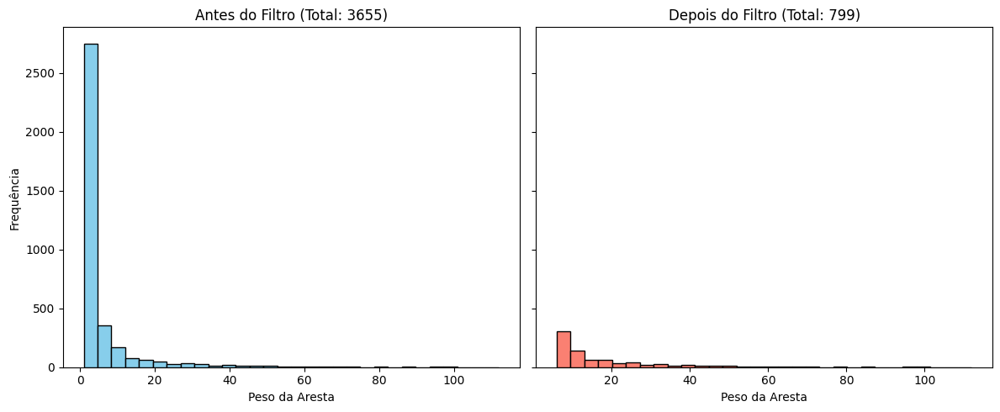

Removidas 2856 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_5_sentence_length.gexf
Processando o grafo: ../data/interim/graphs/complete/g_total_sentence_length.gexf


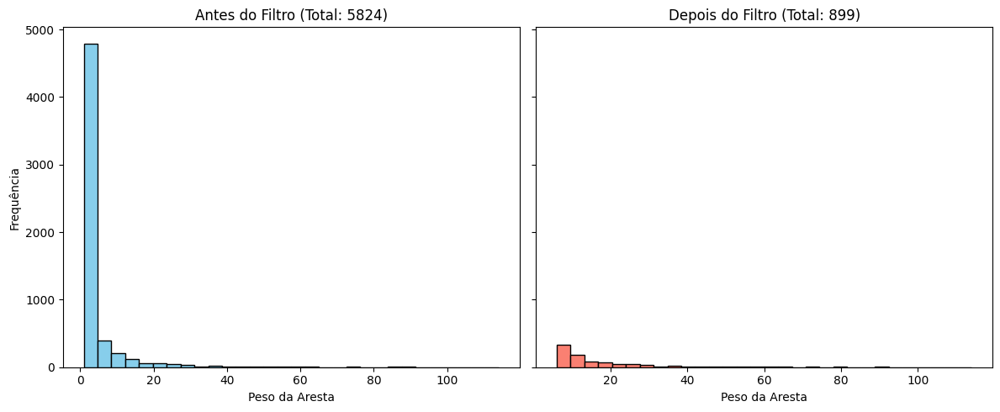

Removidas 4925 arestas.
Grafo salvo em: ../data/interim/graphs/filtered/g_total_sentence_length.gexf


In [8]:
labels_dict = {
   "bigram_shift": ['I', 'O', 'total'],
   "odd_man_out": ["C", "O", "total"],
   "sentence_length": ["0", "1", "2", "3", "4", "5", "total"]
}

# Filter the edges of the graphs based on the weight threshold before calculating the metrics
for dataset_name, labels in labels_dict.items():
  for label in labels:

    filter_and_plot_edges(f"{GRAPH_PATH}complete/g_{label}_{dataset_name}.gexf", f"{GRAPH_PATH}filtered/g_{label}_{dataset_name}.gexf", threshold=5)

# Calculate the metrics for each filtered graph and save them in a csv file
for dataset_name in DATASETS_NAMES:
  for label in labels_dict[dataset_name]:
    metrics_per_layer = dict()
    
    for metric_name, metric_func in get_metric_function().items():
      current_graph = nx.read_gexf(f"{FILTERED_GRAPH_PATH}/g_{label}_{dataset_name}.gexf")

      metrics_per_layer[metric_name] = metric_func(current_graph)
    
    df_metrics = dict_to_dataframe(metrics_per_layer)
    df_metrics.to_csv(f'{PROCESSED_DATASET_PATH}/metrics_per_layer_{dataset_name}_{label}.csv', index=False)

# Show Metrics per Layer


📊 Processando dataset: bigram_shift


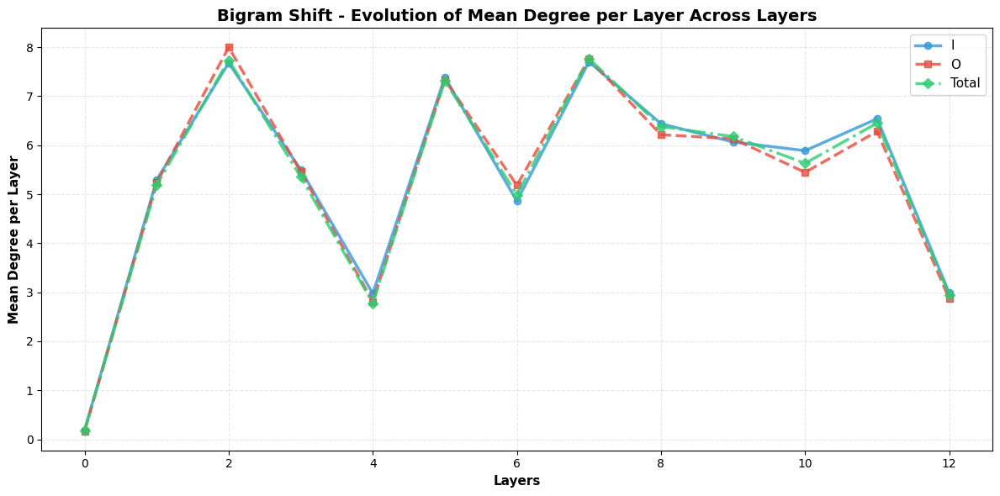

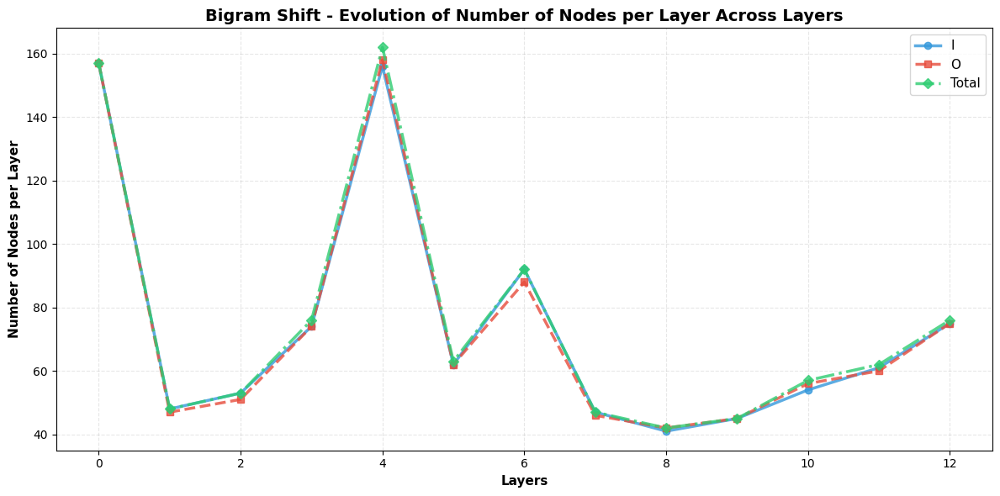

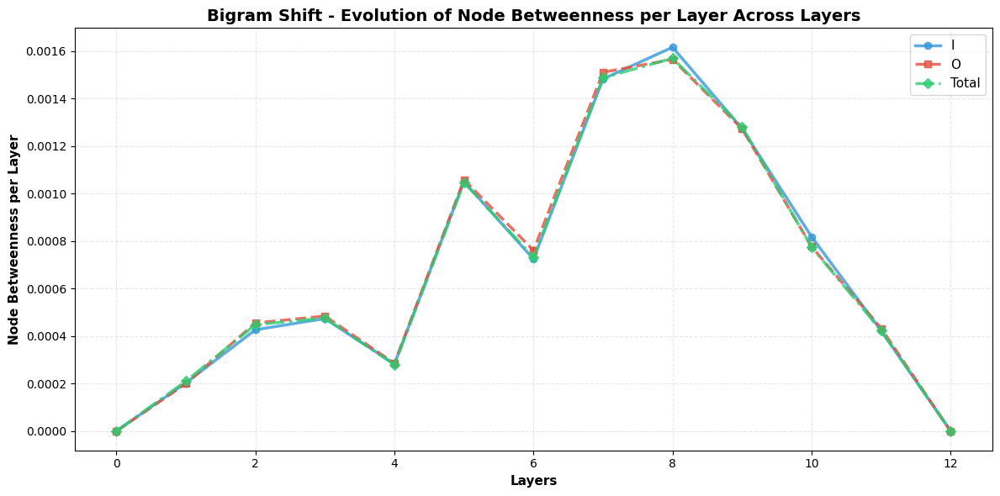

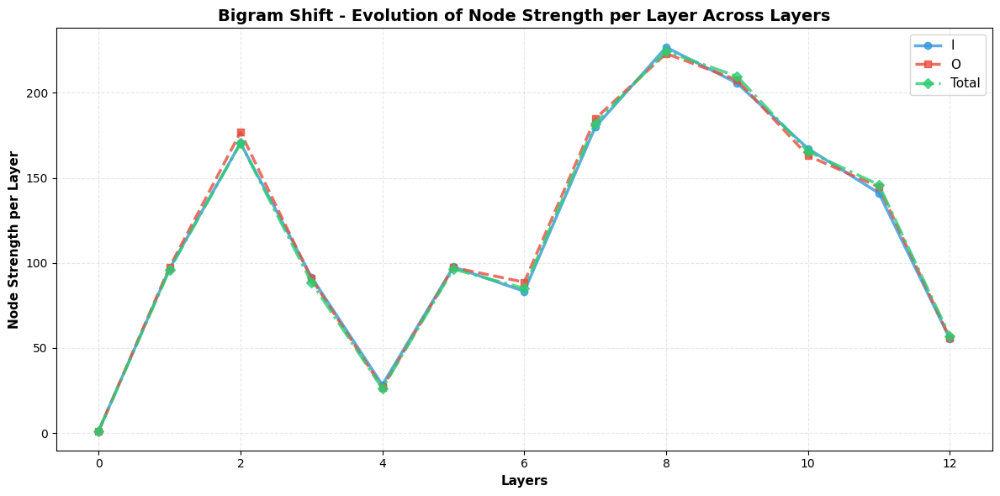

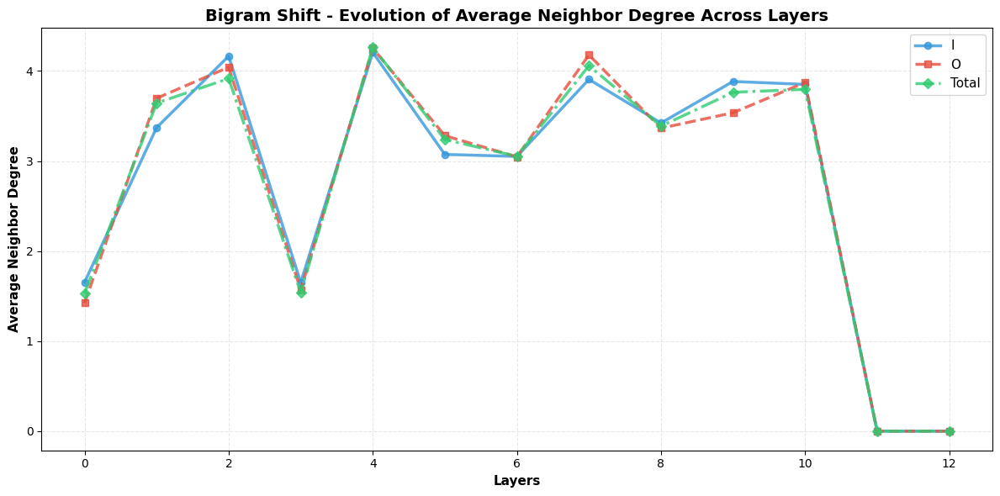

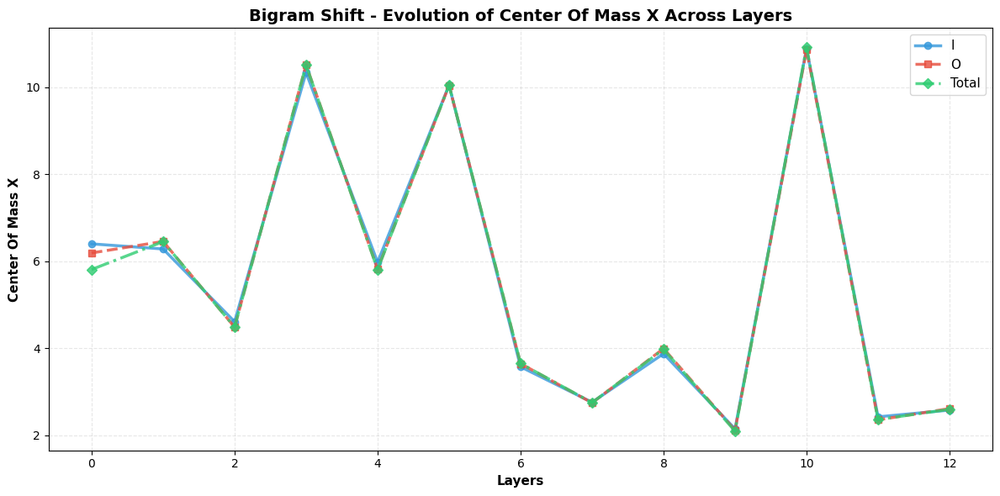

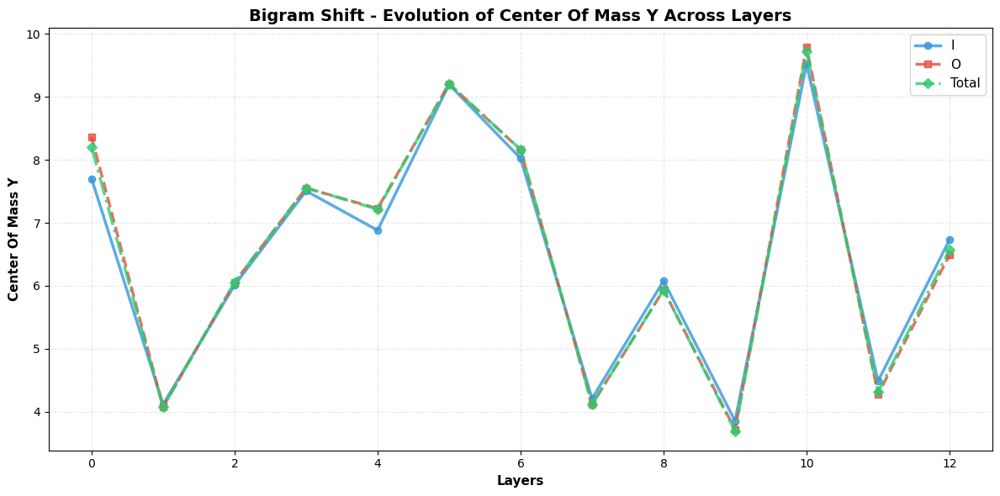

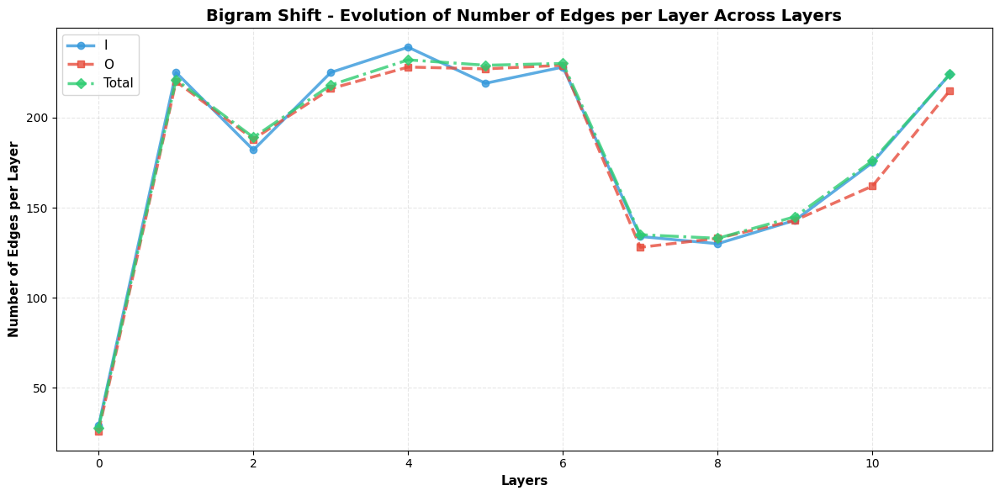

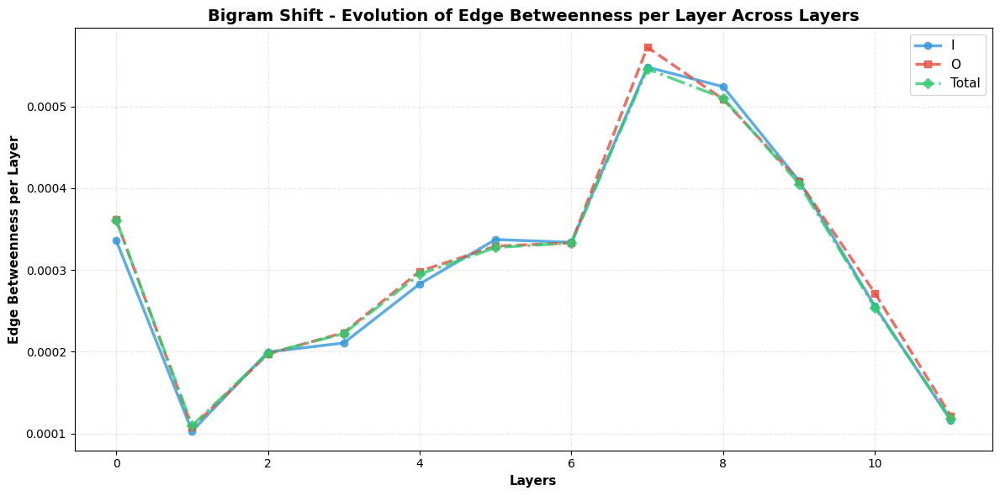


📊 Processando dataset: odd_man_out


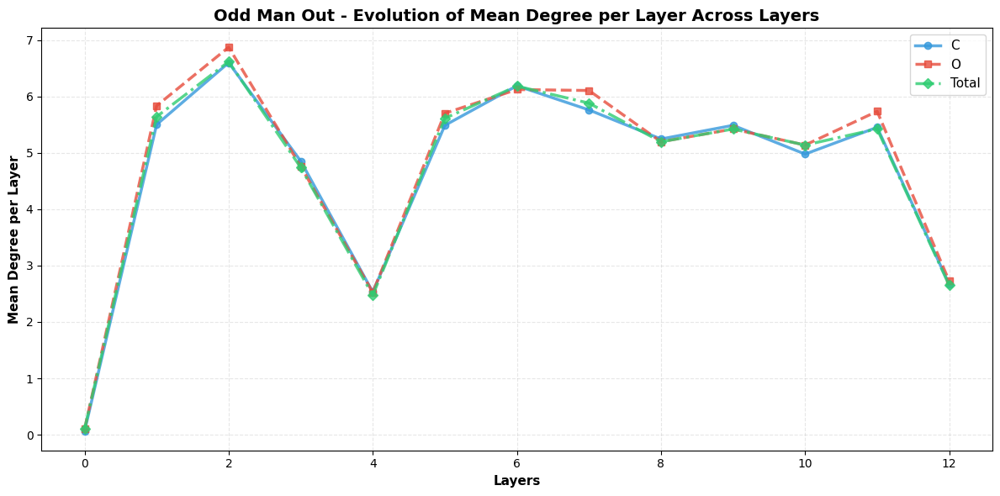

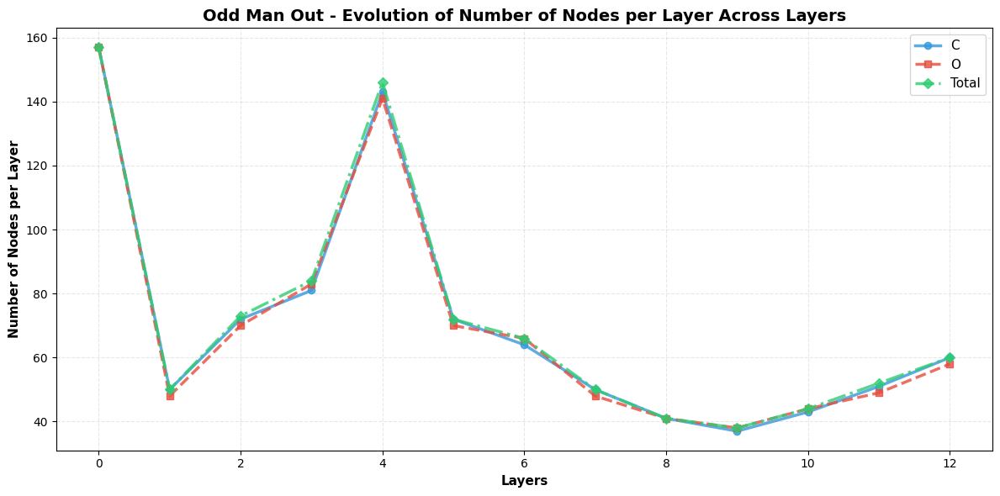

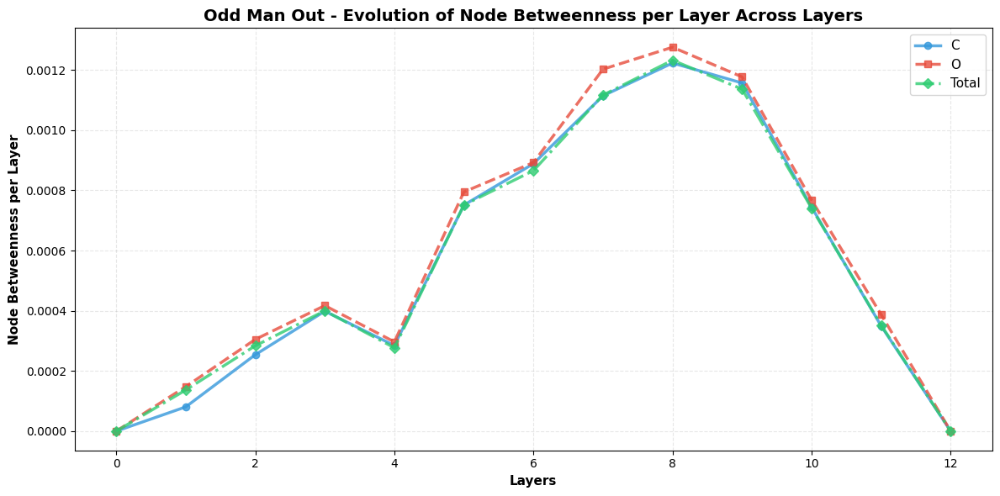

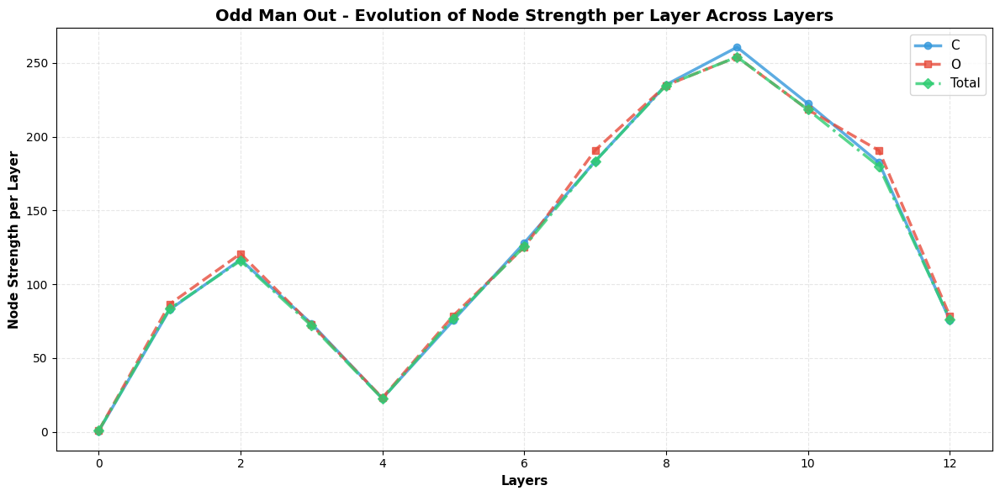

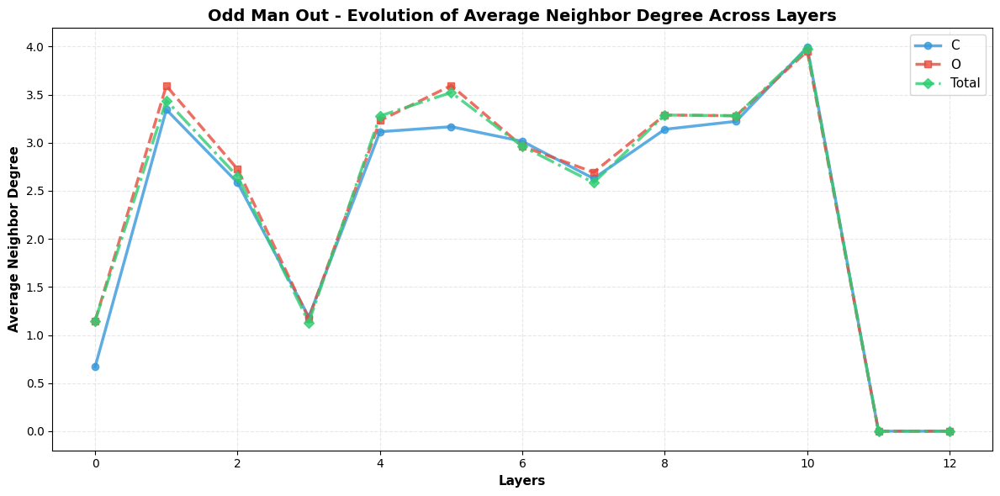

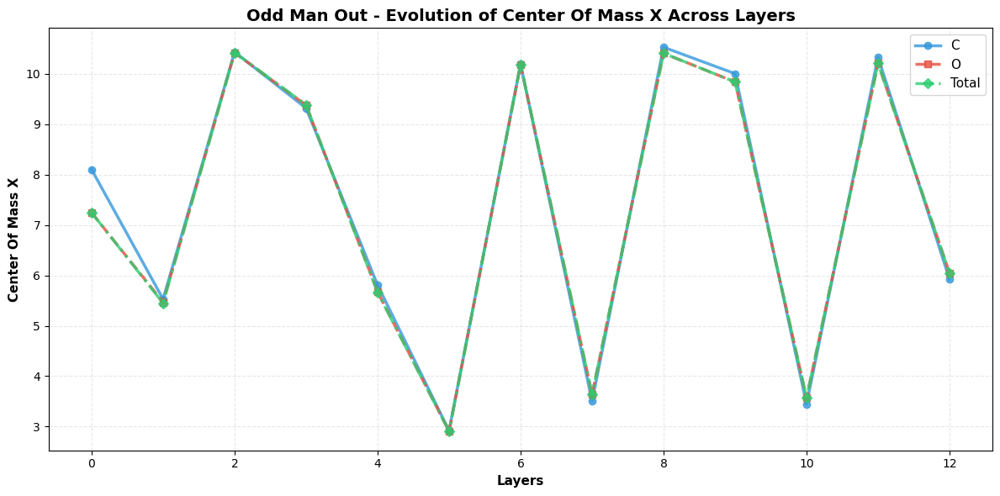

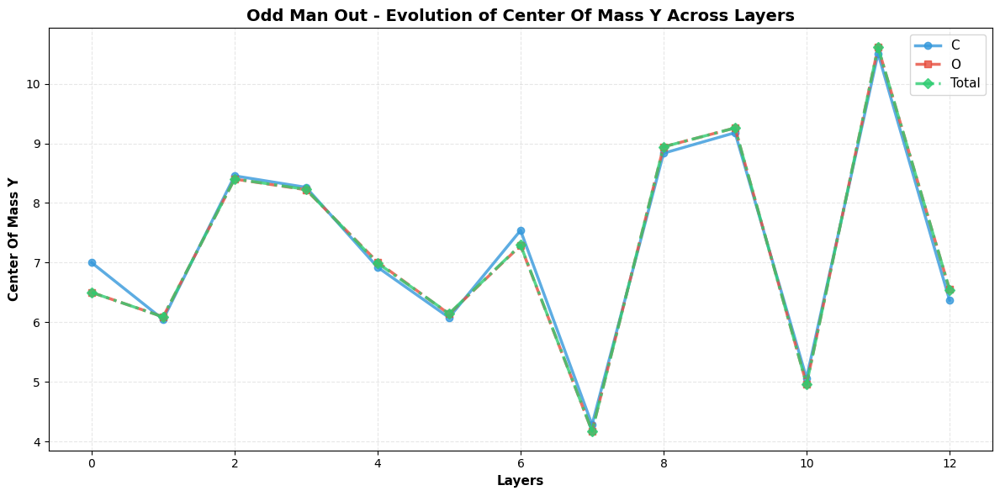

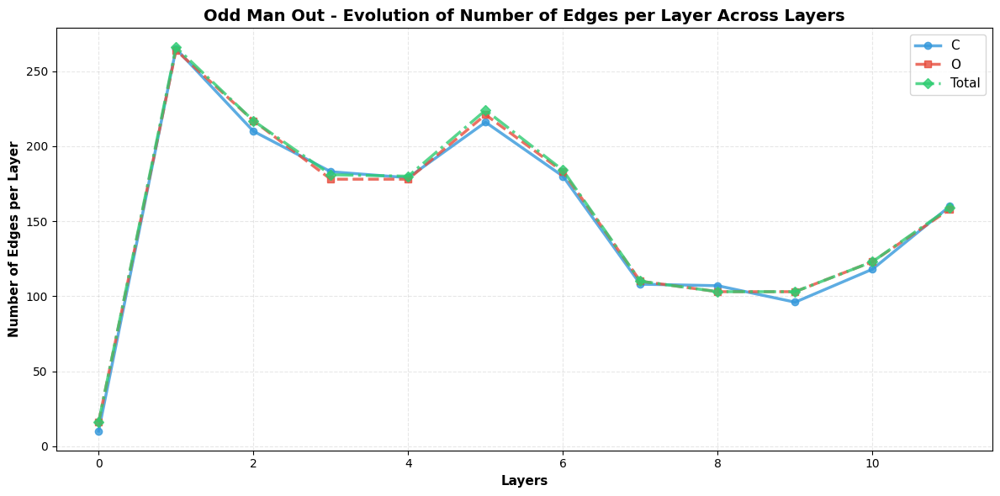

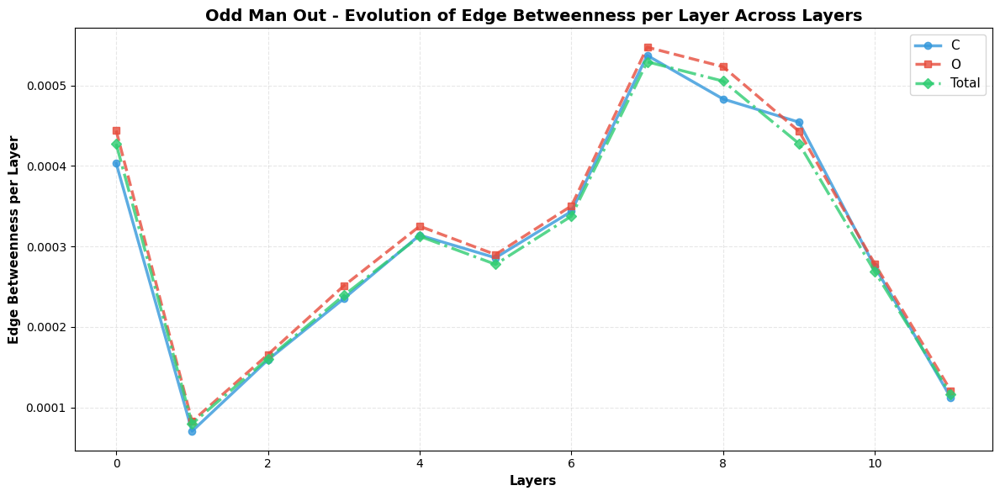


📊 Processando dataset: sentence_length


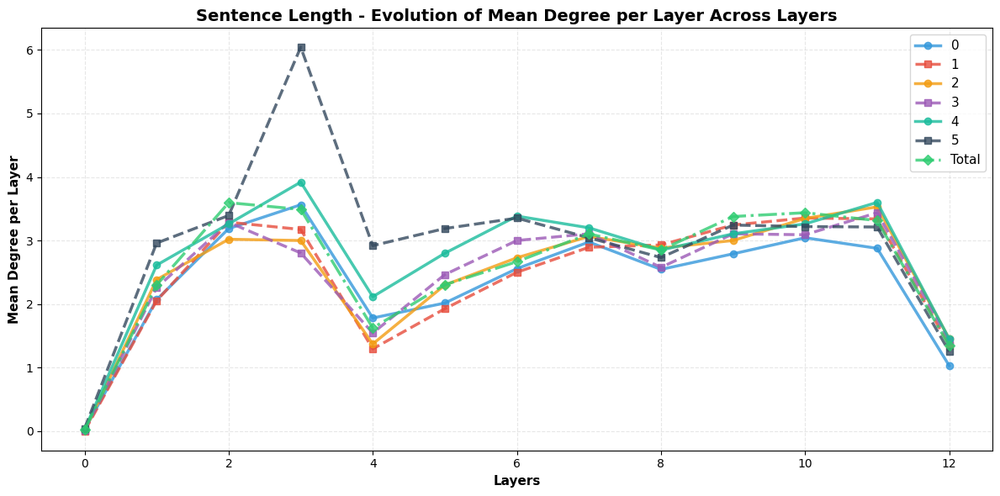

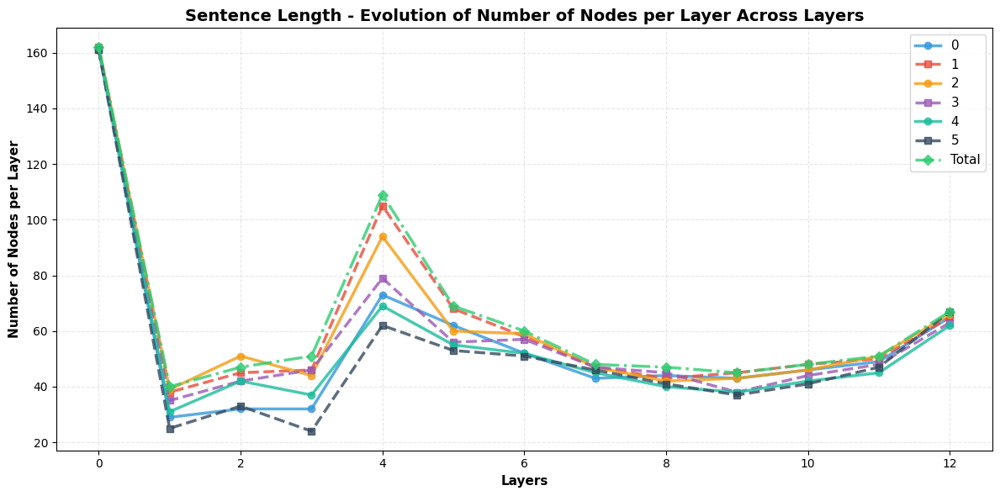

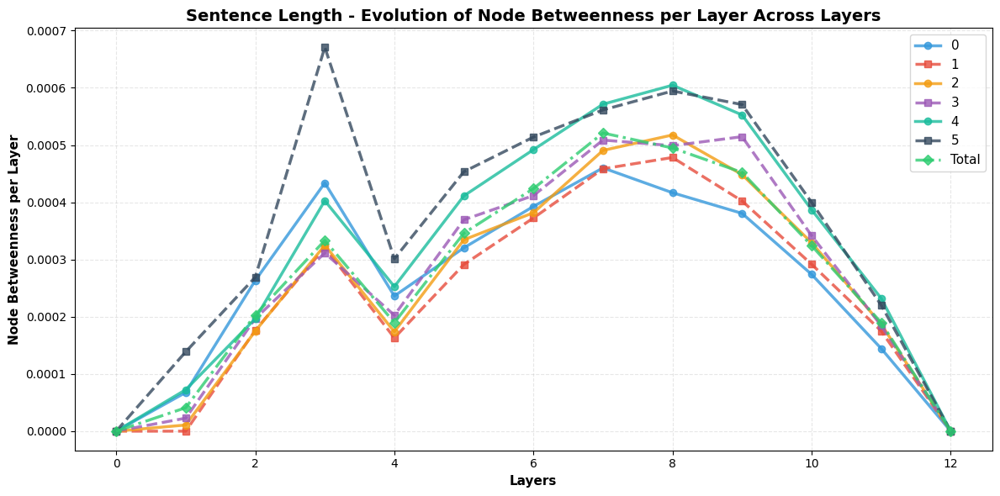

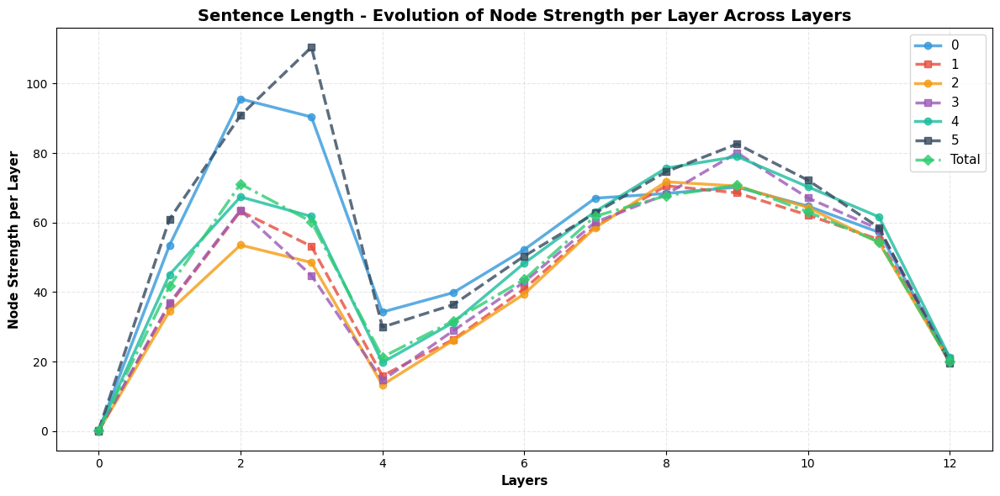

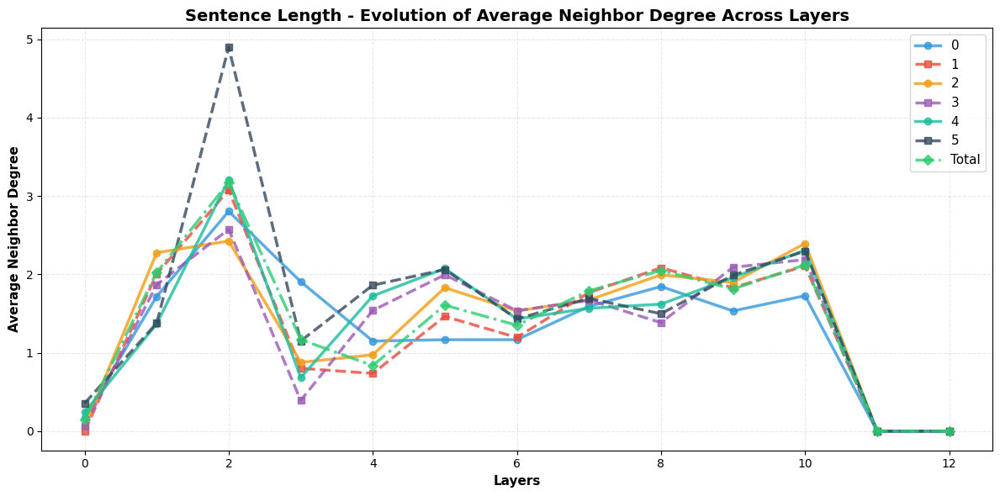

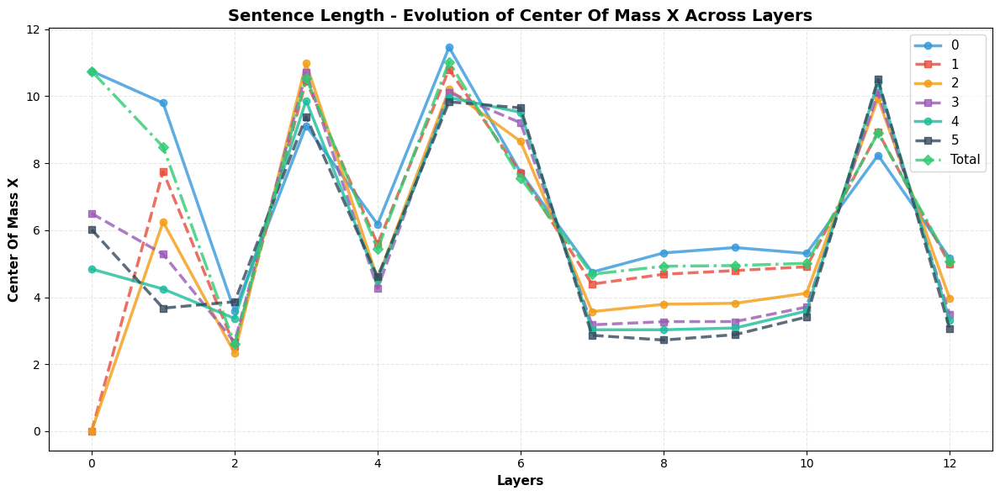

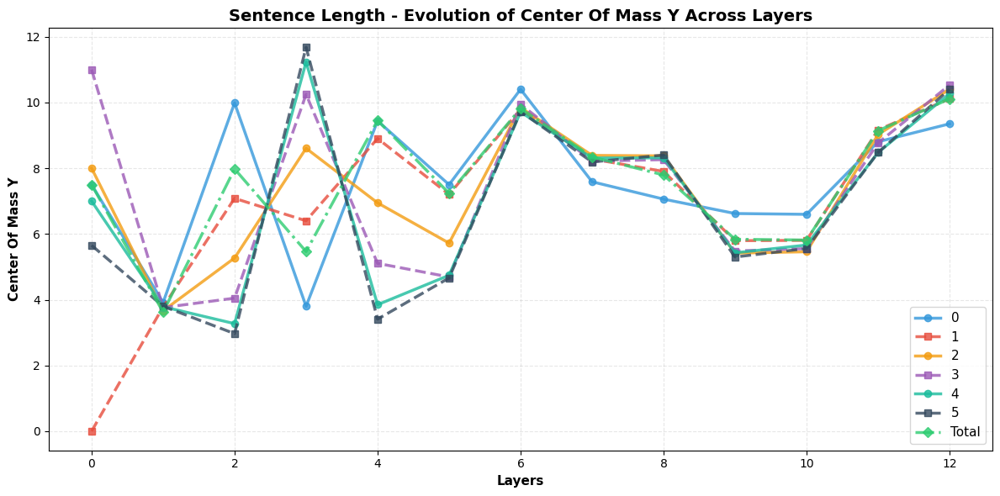

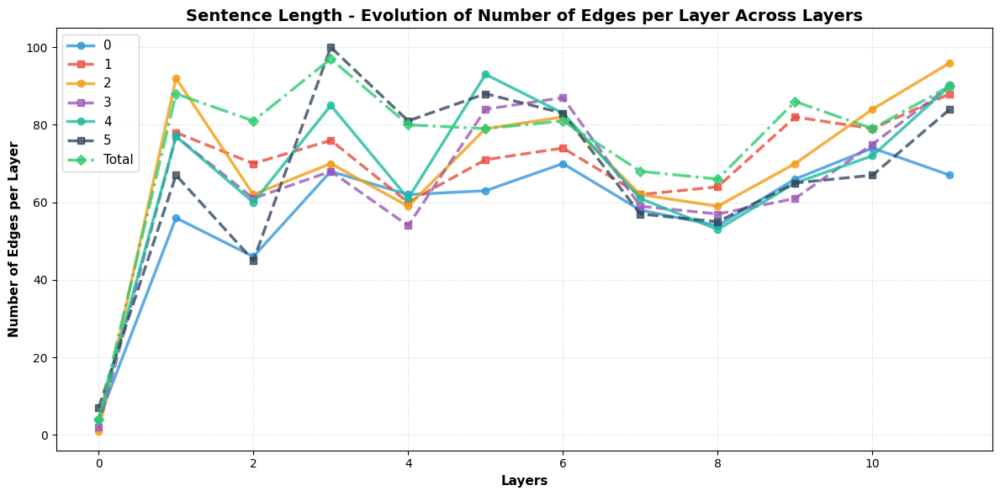

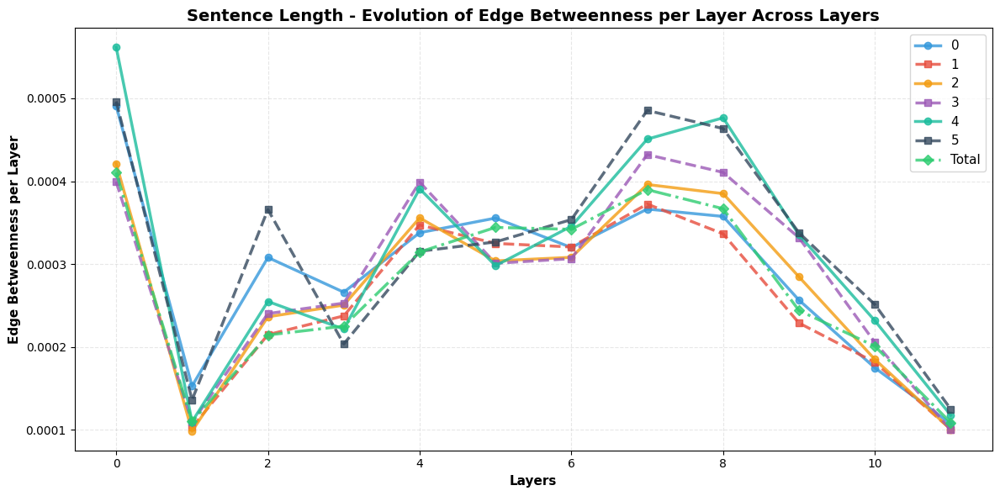

In [6]:
import os

def plot_csv_layer_evolution_generalized(dataset_name, labels_list, metric_name, base_path=PROCESSED_DATASET_PATH, ylabel=None):
    """
    Plota a evolução de uma métrica através das camadas para um dataset específico.
    
    Args:
        dataset_name: Nome do dataset (ex: 'bigram_shift', 'odd_man_out')
        labels_list: Lista de labels para o dataset (ex: ['I', 'O', 'total'])
        metric_name: Nome da métrica a plotar
        base_path: Caminho base dos arquivos CSV
        ylabel: Label customizado para o eixo Y (opcional)
    """
    plt.figure(figsize=(12, 6))
    
    # Cores automáticas baseadas no índice (exceto 'total' que sempre é verde)
    color_palette = ["#3498db", "#e74c3c", "#f39c12", "#9b59b6", "#1abc9c", "#34495e"]
    
    found_any_data = False
    
    for idx, label in enumerate(labels_list):
        file_path = f"{base_path}metrics_per_layer_{dataset_name}_{label}.csv"
        
        if os.path.exists(file_path):
            df_metrics = pd.read_csv(file_path)
            
            if metric_name in df_metrics.columns:
                # Definir cor e estilo
                if label == "total":
                    color = "#2ecc71"
                    linestyle = "-."
                    marker = "D"
                    style_label = "Total"
                else:
                    color = color_palette[idx % len(color_palette)]
                    linestyle = "-" if idx % 2 == 0 else "--"
                    marker = "o" if idx % 2 == 0 else "s"
                    style_label = label
                
                plt.plot(
                    df_metrics['layer'],
                    df_metrics[metric_name],
                    label=style_label,
                    color=color,
                    linestyle=linestyle,
                    linewidth=2.5,
                    marker=marker,
                    markersize=6,
                    alpha=0.8
                )
                found_any_data = True
        else:
            print(f"⚠ Arquivo não encontrado: {file_path}")
    
    if not found_any_data:
        plt.close()
        print(f"❌ Nenhum arquivo encontrado para o dataset: {dataset_name}")
        return

    # Configurações de labels e título
    if ylabel is None:
        ylabel = metric_name.replace('_', ' ').title()
    
    plt.title(f"{dataset_name.replace('_', ' ').title()} - Evolution of {ylabel} Across Layers", 
              fontsize=14, fontweight='bold')
    plt.xlabel("Layers", fontweight='bold', fontsize=11)
    plt.ylabel(ylabel, fontweight='bold', fontsize=11)
    plt.legend(fontsize=11, loc='best')
    plt.grid(alpha=0.3, linestyle='--')
    plt.tight_layout()
    plt.show()


# ===== Exemplo de uso =====
labels = {
   "bigram_shift": ['I', 'O', 'total'],
   "odd_man_out": ["C", "O", "total"],
   "sentence_length": ["0", "1", "2", "3", "4", "5", "total"]
}

metric_labels = {
    "num_nodes_per_layer": "Number of Nodes per Layer",
    "edge_num_edges_per_layer": "Number of Edges per Layer",
    "degree_per_layer": "Mean Degree per Layer",
    "node_betweenness_per_layer": "Node Betweenness per Layer",
    "node_strength_per_layer": "Node Strength per Layer",
    "average_neighbor_degree": "Average Neighbor Degree",
    "edge_edge_betweenness_per_layer": "Edge Betweenness per Layer"
}

# Plotar para todos os datasets
for dataset_name, labels_list in labels.items():
    print(f"\n📊 Processando dataset: {dataset_name}")
    
    # Detectar métricas disponíveis
    sample_file = f"{PROCESSED_DATASET_PATH}/metrics_per_layer_{dataset_name}_{labels_list[0]}.csv"
    if os.path.exists(sample_file):
        df_sample = pd.read_csv(sample_file)
        metrics_to_plot = [col for col in df_sample.columns if col not in ['layer', 'layer_description']]
        
        for metric_name in metrics_to_plot:
            ylabel = metric_labels.get(metric_name, metric_name.replace('_', ' ').title())
            plot_csv_layer_evolution_generalized(dataset_name, labels_list, metric_name, ylabel=ylabel)

# Probing using Features

Investiga a relação entre a topologia da informação e a capacidade de representação do modelo.  
A abordagem clássica de probing verifica apenas se uma determinada camada possui a informação necessária para resolver uma tarefa.  

* O classificado determina se quais camadas estão mais aptas a resolver um determinado problema, se certas metricas acompanham essa curva, podesse usa-las para entender como a topologia dos NRAGs conversa com a distribuição de conhecimento no modelo.

Carregando rótulos do dataset: bigram_shift
Resultados do Probing (Acurácia por Camada com Novo Split):
-------------------------------------------------------
Camada 00: Acurácia de 50.00%
Camada 01: Acurácia de 49.60%
Camada 02: Acurácia de 55.45%
Camada 03: Acurácia de 62.50%
Camada 04: Acurácia de 72.85%
Camada 05: Acurácia de 80.25%
Camada 06: Acurácia de 81.25%
Camada 07: Acurácia de 80.00%
Camada 08: Acurácia de 80.70%
Camada 09: Acurácia de 84.05%
Camada 10: Acurácia de 84.85%
Camada 11: Acurácia de 85.05%
Camada 12: Acurácia de 83.70%

✓ Resultados salvos em: ../data/processed//probing_bigram_shift_results.csv

Resumo Estatístico dos Resultados:
          layer   accuracy  precision     recall   f1_score
count  13.00000  13.000000  13.000000  13.000000  13.000000
mean    6.00000   0.730962   0.712282   0.730962   0.718060
std     3.89444   0.136804   0.182425   0.136804   0.165085
min     0.00000   0.496000   0.250000   0.496000   0.333333
25%     3.00000   0.625000   0.625085

,layer,accuracy,precision,recall,f1_score,n_train_samples,n_test_samples,n_features
0,0,0.5000,0.250000,0.5000,0.333333,8000,2000,768
1,1,0.4960,0.495999,0.4960,0.495975,8000,2000,768
2,2,0.5545,0.554500,0.5545,0.554499,8000,2000,768
3,3,0.6250,0.625085,0.6250,0.624937,8000,2000,768
4,4,0.7285,0.728506,0.7285,0.728498,8000,2000,768
5,5,0.8025,0.803864,0.8025,0.802278,8000,2000,768
6,6,0.8125,0.813380,0.8125,0.812368,8000,2000,768
7,7,0.8000,0.800270,0.8000,0.799955,8000,2000,768
8,8,0.8070,0.808036,0.8070,0.806838,8000,2000,768
9,9,0.8405,0.841610,0.8405,0.840370,8000,2000,768


<Figure size 1200x600 with 0 Axes>

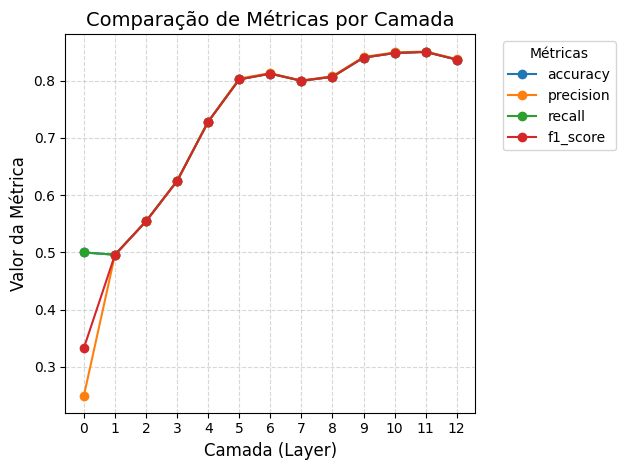

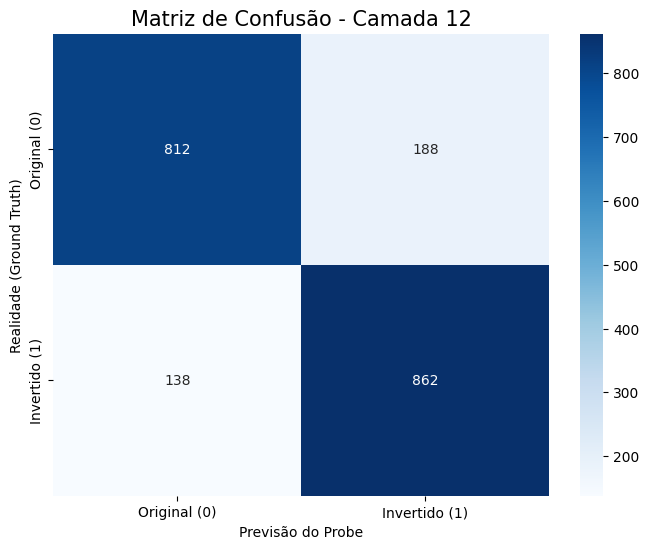

Carregando rótulos do dataset: odd_man_out
Resultados do Probing (Acurácia por Camada com Novo Split):
-------------------------------------------------------
Camada 00: Acurácia de 50.00%
Camada 01: Acurácia de 50.95%
Camada 02: Acurácia de 52.65%
Camada 03: Acurácia de 54.20%
Camada 04: Acurácia de 57.80%
Camada 05: Acurácia de 59.30%
Camada 06: Acurácia de 59.20%
Camada 07: Acurácia de 58.05%
Camada 08: Acurácia de 59.00%
Camada 09: Acurácia de 60.05%
Camada 10: Acurácia de 61.65%
Camada 11: Acurácia de 61.25%
Camada 12: Acurácia de 63.95%

✓ Resultados salvos em: ../data/processed//probing_odd_man_out_results.csv

Resumo Estatístico dos Resultados:
          layer   accuracy  precision     recall   f1_score
count  13.00000  13.000000  13.000000  13.000000  13.000000
mean    6.00000   0.575423   0.556208   0.575423   0.562574
std     3.89444   0.042983   0.098989   0.042983   0.077972
min     0.00000   0.500000   0.250000   0.500000   0.333333
25%     3.00000   0.542000   0.542017  

,layer,accuracy,precision,recall,f1_score,n_train_samples,n_test_samples,n_features
0,0,0.5000,0.250000,0.5000,0.333333,8000,2000,768
1,1,0.5095,0.509508,0.5095,0.509397,8000,2000,768
2,2,0.5265,0.526510,0.5265,0.526457,8000,2000,768
3,3,0.5420,0.542017,0.5420,0.541954,8000,2000,768
4,4,0.5780,0.578015,0.5780,0.577979,8000,2000,768
5,5,0.5930,0.593000,0.5930,0.593000,8000,2000,768
6,6,0.5920,0.592024,0.5920,0.591974,8000,2000,768
7,7,0.5805,0.580504,0.5805,0.580495,8000,2000,768
8,8,0.5900,0.590052,0.5900,0.589941,8000,2000,768
9,9,0.6005,0.600529,0.6005,0.600471,8000,2000,768


<Figure size 1200x600 with 0 Axes>

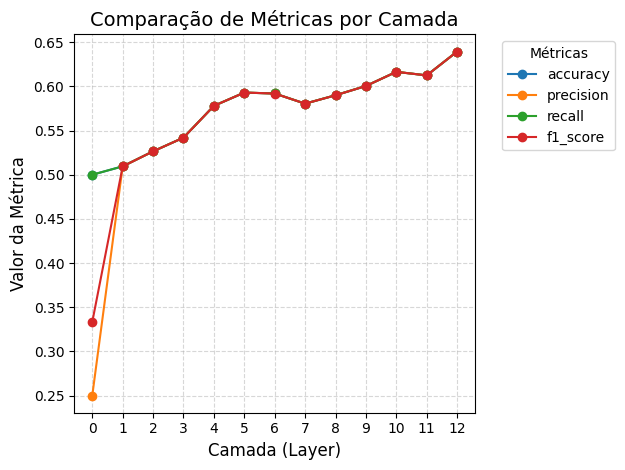

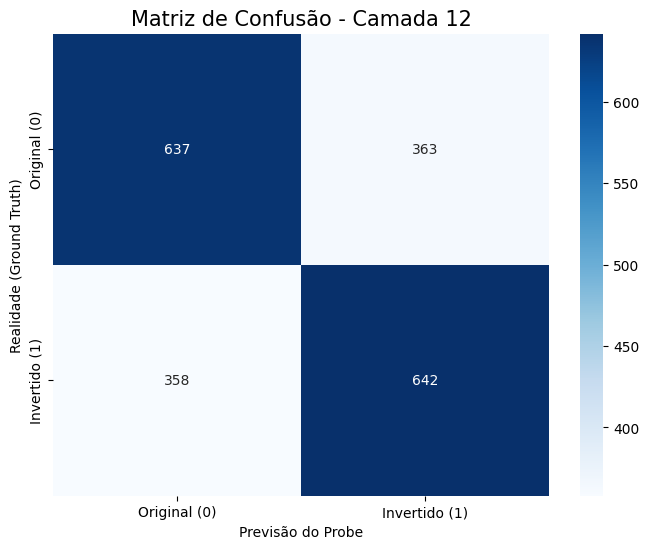

Carregando rótulos do dataset: sentence_length
Resultados do Probing (Acurácia por Camada com Novo Split):
-------------------------------------------------------
Camada 00: Acurácia de 16.65%
Camada 01: Acurácia de 87.70%
Camada 02: Acurácia de 89.55%
Camada 03: Acurácia de 90.40%
Camada 04: Acurácia de 87.85%


/home/f-msc2026/ra256352/Documents/pos/code/master_degree_lab/venv/lib64/python3.13/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Camada 05: Acurácia de 84.20%


/home/f-msc2026/ra256352/Documents/pos/code/master_degree_lab/venv/lib64/python3.13/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Camada 06: Acurácia de 80.65%


/home/f-msc2026/ra256352/Documents/pos/code/master_degree_lab/venv/lib64/python3.13/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Camada 07: Acurácia de 73.00%


/home/f-msc2026/ra256352/Documents/pos/code/master_degree_lab/venv/lib64/python3.13/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Camada 08: Acurácia de 71.20%
Camada 09: Acurácia de 67.40%
Camada 10: Acurácia de 65.15%
Camada 11: Acurácia de 60.80%
Camada 12: Acurácia de 55.25%

✓ Resultados salvos em: ../data/processed//probing_sentence_length_results.csv

Resumo Estatístico dos Resultados:
          layer   accuracy  precision     recall   f1_score
count  13.00000  13.000000  13.000000  13.000000  13.000000
mean    6.00000   0.715231   0.704873   0.715231   0.706069
std     3.89444   0.202162   0.235000   0.202162   0.230021
min     0.00000   0.166500   0.027722   0.166500   0.047531
25%     3.00000   0.651500   0.651478   0.651500   0.651428
50%     6.00000   0.730000   0.733071   0.730000   0.730909
75%     9.00000   0.877000   0.877335   0.877000   0.876993
max    12.00000   0.904000   0.904766   0.904000   0.904281

Tabela Completa de Resultados:


,layer,accuracy,precision,recall,f1_score,n_train_samples,n_test_samples,n_features
0,0,0.1665,0.027722,0.1665,0.047531,7996,2000,768
1,1,0.8770,0.877335,0.8770,0.876993,7996,2000,768
2,2,0.8955,0.896693,0.8955,0.895856,7996,2000,768
3,3,0.9040,0.904766,0.9040,0.904281,7996,2000,768
4,4,0.8785,0.879141,0.8785,0.878692,7996,2000,768
5,5,0.8420,0.843095,0.8420,0.842395,7996,2000,768
6,6,0.8065,0.806974,0.8065,0.806601,7996,2000,768
7,7,0.7300,0.733071,0.7300,0.730909,7996,2000,768
8,8,0.7120,0.710634,0.7120,0.711238,7996,2000,768
9,9,0.6740,0.672728,0.6740,0.673324,7996,2000,768


<Figure size 1200x600 with 0 Axes>

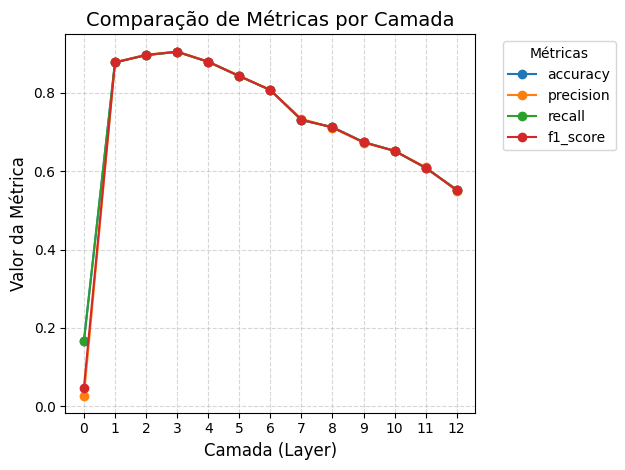

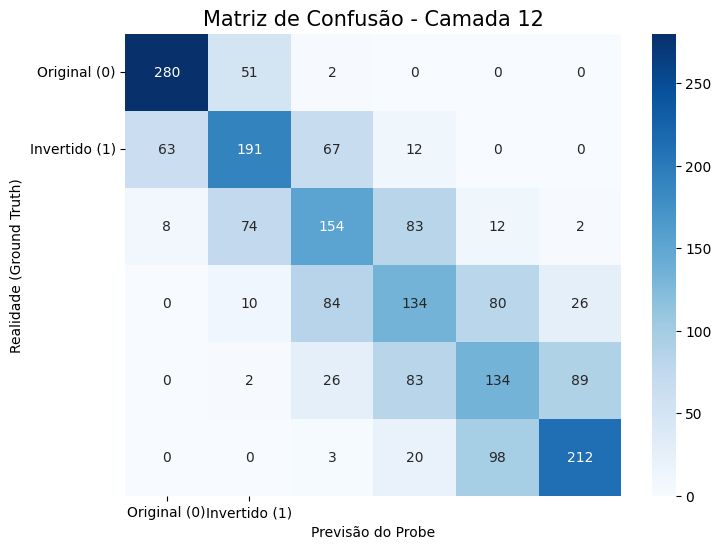

In [19]:
import json
import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

for dataset_name in DATASETS_NAMES:
    print("====================================================")
    print(f"Carregando rótulos do dataset: {dataset_name}")
    print("====================================================")

    # 1. Carregar apenas os Rótulos do bigram_shift.txt (ignorando os splits antigos)
    labels = []

    with open(f"{RAW_DATASET_PATH}/{dataset_name}.txt", "r", encoding="utf-8") as f:
        for line in f:
            parts = line.strip().split("\t")
            if len(parts) >= 3:
                labels.append(parts[1])

    y = np.array(labels)

    # 2. Carregar as Ativações do JSONL gerado pelo ActivationAreas
    activations_per_layer = {} 

    with open(f"{INTERIM_DATASET_PATH}/{dataset_name}_features.json", "r", encoding="utf-8") as f:
        for line_idx, line in enumerate(f):
            data = json.loads(line)
            
            layers_data = data["features"][0]["layers"]
            
            for layer in layers_data:
                layer_idx = layer["index"]
                layer_values = layer["values"]
                
                if layer_idx not in activations_per_layer:
                    activations_per_layer[layer_idx] = []
                    
                activations_per_layer[layer_idx].append(layer_values)

    # 3. Criar novos splits e treinar o Probe para CADA camada
    print("Resultados do Probing (Acurácia por Camada com Novo Split):")
    print("-" * 55)

    # O random_state garante que o split seja reprodutível em futuras execuções
    # O stratify=y garante que a proporção de classes se mantenha no treino e teste
    results_list = []

    for layer_idx in sorted(activations_per_layer.keys()):
        X = np.array(activations_per_layer[layer_idx])
        
        # Criando um novo split: 80% para treino do probe, 20% para teste
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.20, random_state=42, stratify=y
        )
        
        # Treinando o Linear Probe
        probe = LogisticRegression(max_iter=1000, class_weight='balanced')
        probe.fit(X_train, y_train)
        
        # Avaliando
        predictions = probe.predict(X_test)
        acc = accuracy_score(y_test, predictions)
        precision = precision_score(y_test, predictions, average='weighted', zero_division=0)
        recall = recall_score(y_test, predictions, average='weighted', zero_division=0)
        f1 = f1_score(y_test, predictions, average='weighted', zero_division=0)
        
        # Armazenar resultados para DataFrame
        results_list.append({
            'layer': layer_idx,
            'accuracy': acc,
            'precision': precision,
            'recall': recall,
            'f1_score': f1,
            'n_train_samples': len(y_train),
            'n_test_samples': len(y_test),
            'n_features': X.shape[1]
        })
        
        print(f"Camada {layer_idx:02d}: Acurácia de {acc * 100:.2f}%")

    # 4. Criar DataFrame com os resultados
    df_probing_results = pd.DataFrame(results_list)

    # 5. Salvar DataFrame em CSV
    output_path = f'{PROCESSED_DATASET_PATH}/probing_{dataset_name}_results.csv'
    df_probing_results.to_csv(output_path, index=False)
    print(f"\n✓ Resultados salvos em: {output_path}")

    # 6. Exibir resumo estatístico
    print("\n" + "="*55)
    print("Resumo Estatístico dos Resultados:")
    print("="*55)
    print(df_probing_results[['layer', 'accuracy', 'precision', 'recall', 'f1_score']].describe())

    # 7. Exibir o DataFrame completo
    print("\n" + "="*55)
    print("Tabela Completa de Resultados:")
    print("="*55)
    display(df_probing_results)


    # ================================================
    #  plot probing results
    # ================================================

    # 1. Garantir que as camadas estejam em ordem crescente
    df_plot = df_probing_results.sort_values(by='layer')

    # 2. Definir a coluna 'layer' como índice para facilitar o plot de múltiplas colunas
    df_plot = df_plot.set_index('layer')

    # 3. Criar o gráfico
    plt.figure(figsize=(12, 6))

    # O pandas automaticamente cria uma linha para cada coluna numérica restante
    df_plot_filtered = df_plot.drop(columns=[col for col in df_plot.columns if col.startswith('n_')])
    df_plot_filtered.plot(marker='o')

    # 4. Customização
    plt.title('Comparação de Métricas por Camada', fontsize=14)
    plt.xlabel('Camada (Layer)', fontsize=12)
    plt.ylabel('Valor da Métrica', fontsize=12)
    plt.xticks(df_plot.index) # Garante que cada camada tenha seu rótulo no eixo X
    plt.legend(title='Métricas', bbox_to_anchor=(1.05, 1), loc='upper left') # Legenda fora do gráfico
    plt.grid(True, linestyle='--', alpha=0.5)

    plt.tight_layout() # Ajusta o layout para a legenda não ser cortada
    plt.show()


    # ================================================
    #  confusion_matrix
    # ================================================


    cm = confusion_matrix(y_test, predictions)

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=['Original (0)', 'Invertido (1)'], 
                yticklabels=['Original (0)', 'Invertido (1)'])

    plt.title(f'Matriz de Confusão - Camada {layer_idx}', fontsize=15)
    plt.ylabel('Realidade (Ground Truth)')
    plt.xlabel('Previsão do Probe')
    plt.show()

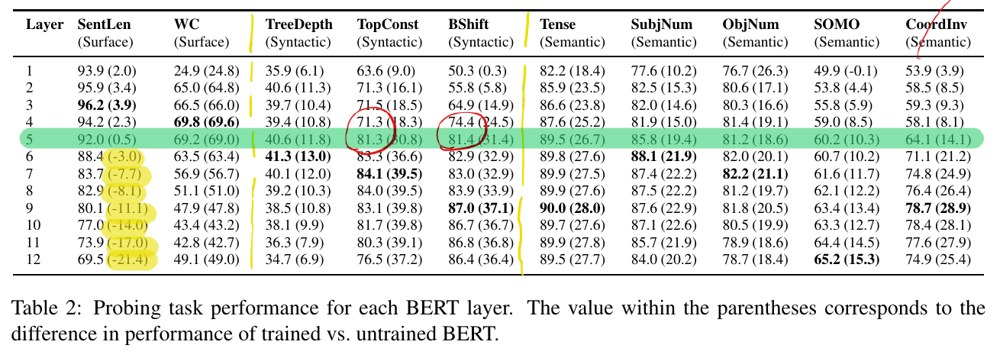

Carregando rótulos do dataset: bigram_shift


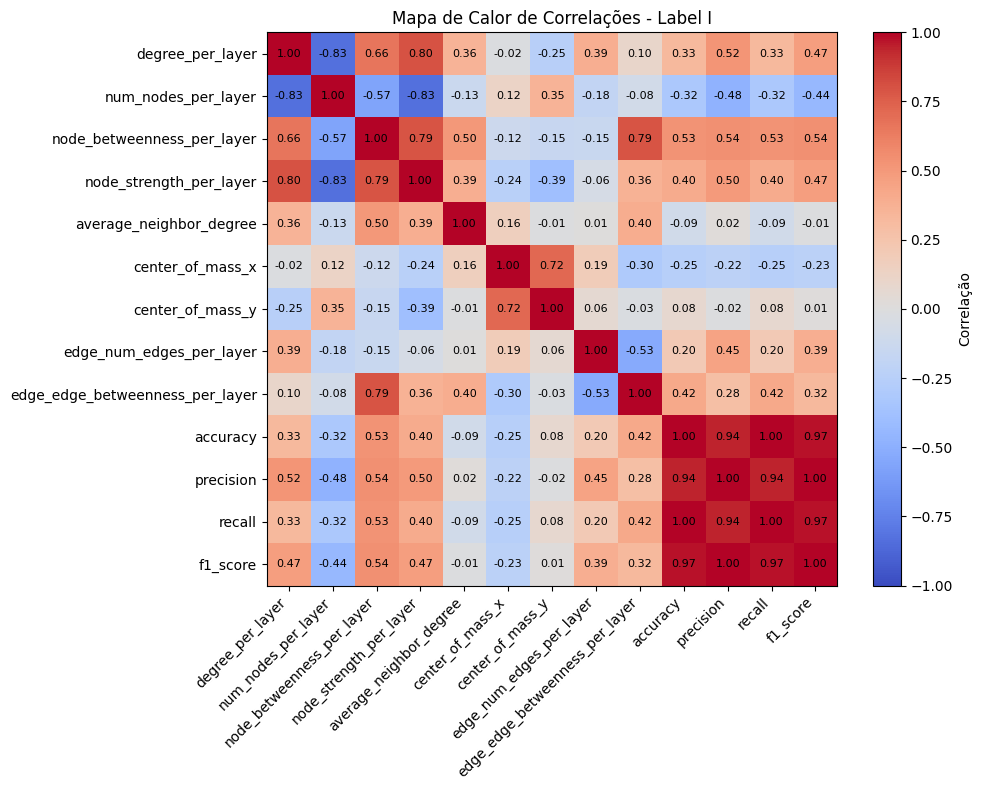

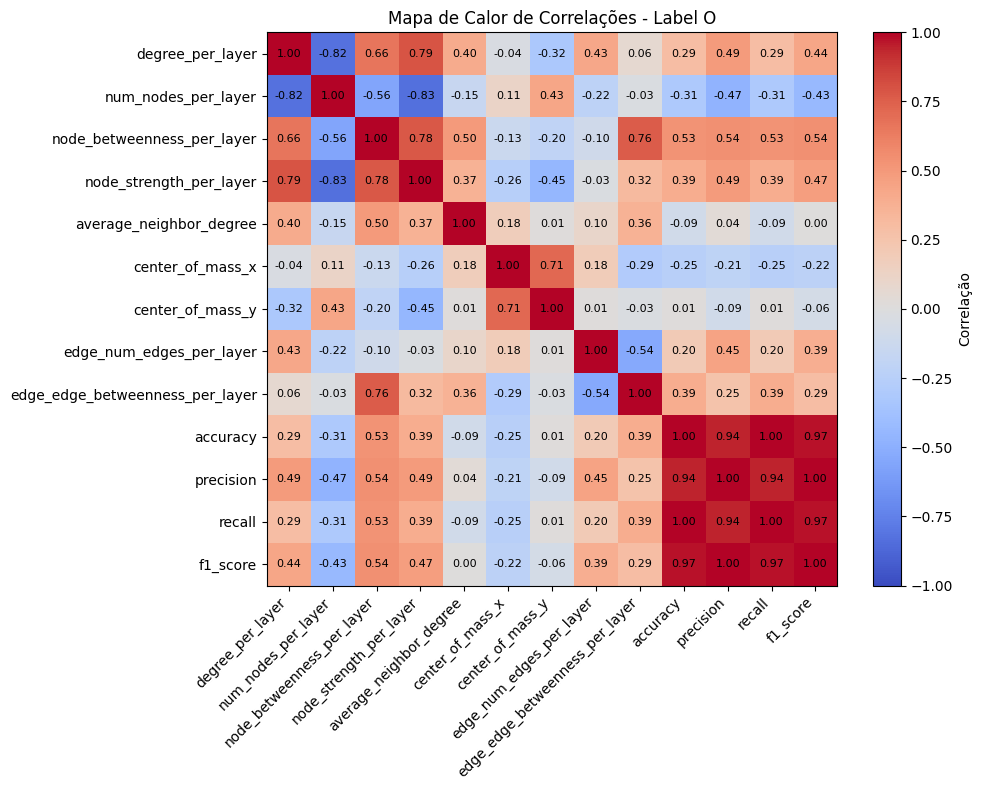

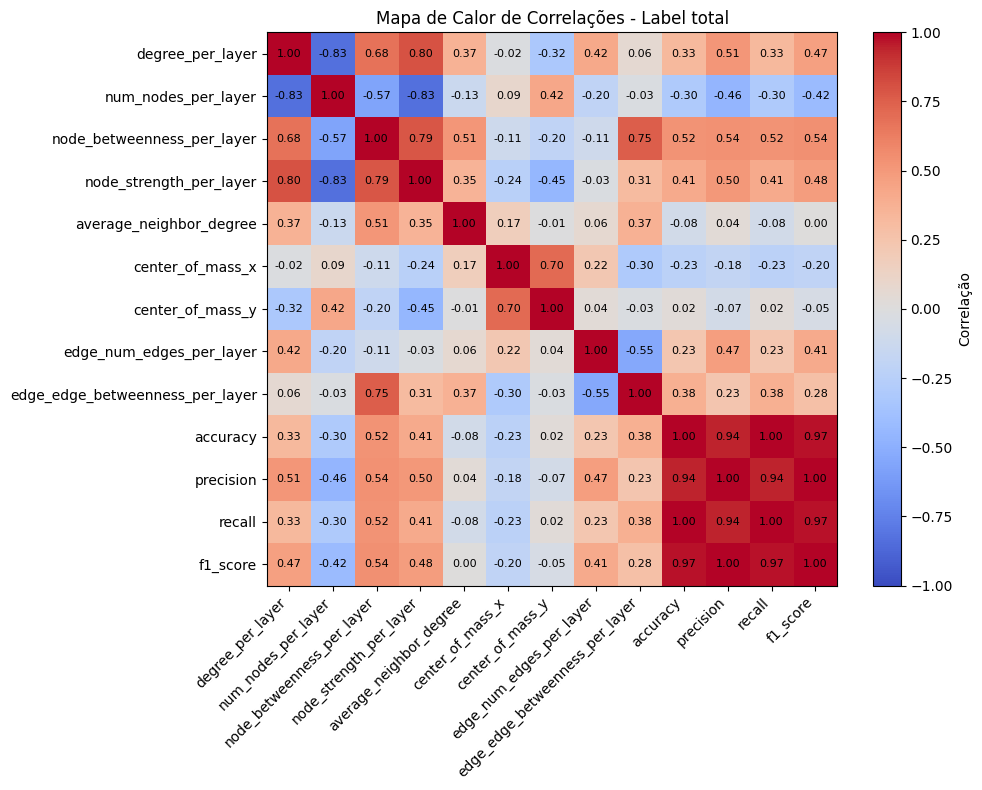

Carregando rótulos do dataset: odd_man_out


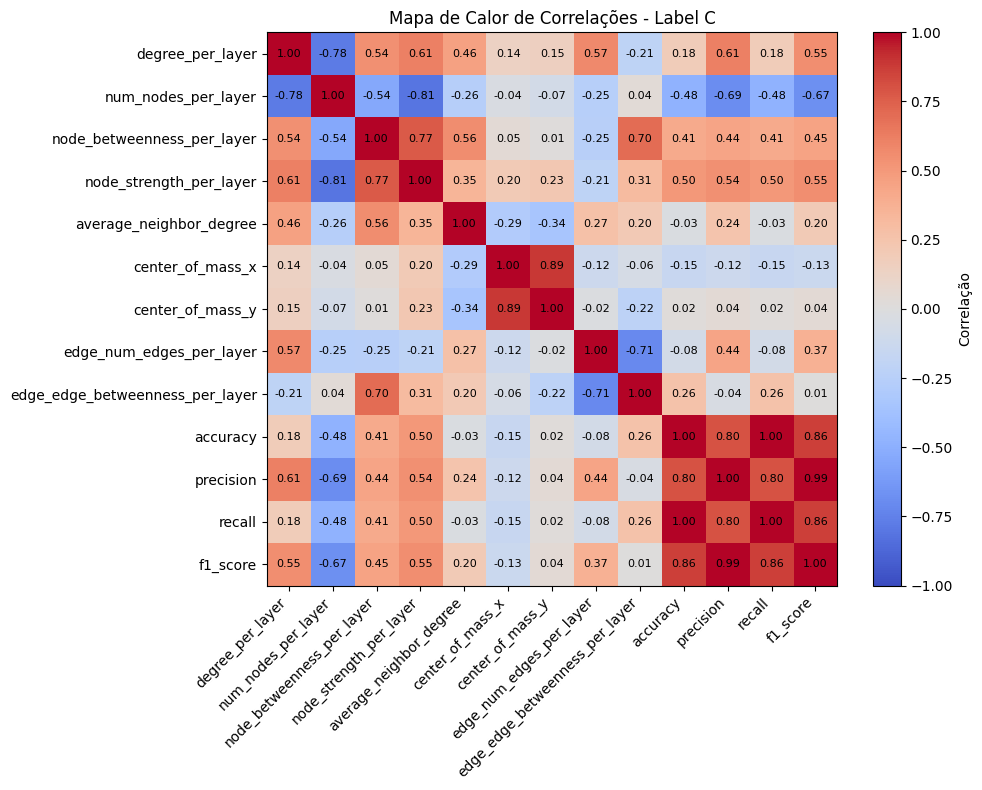

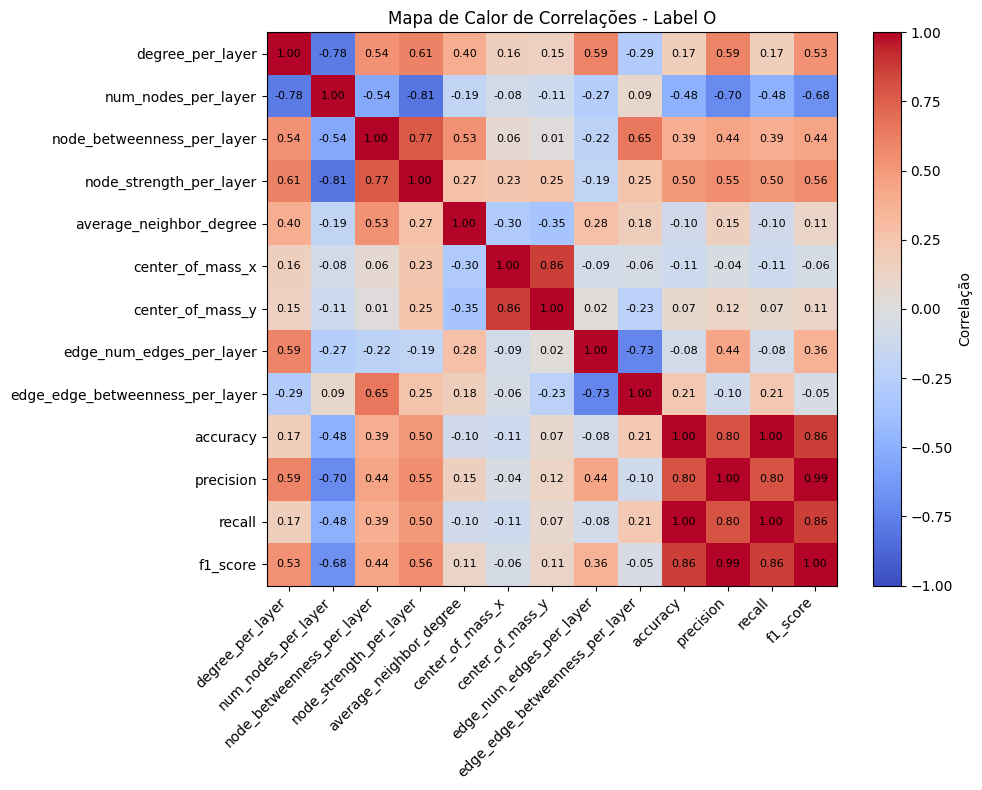

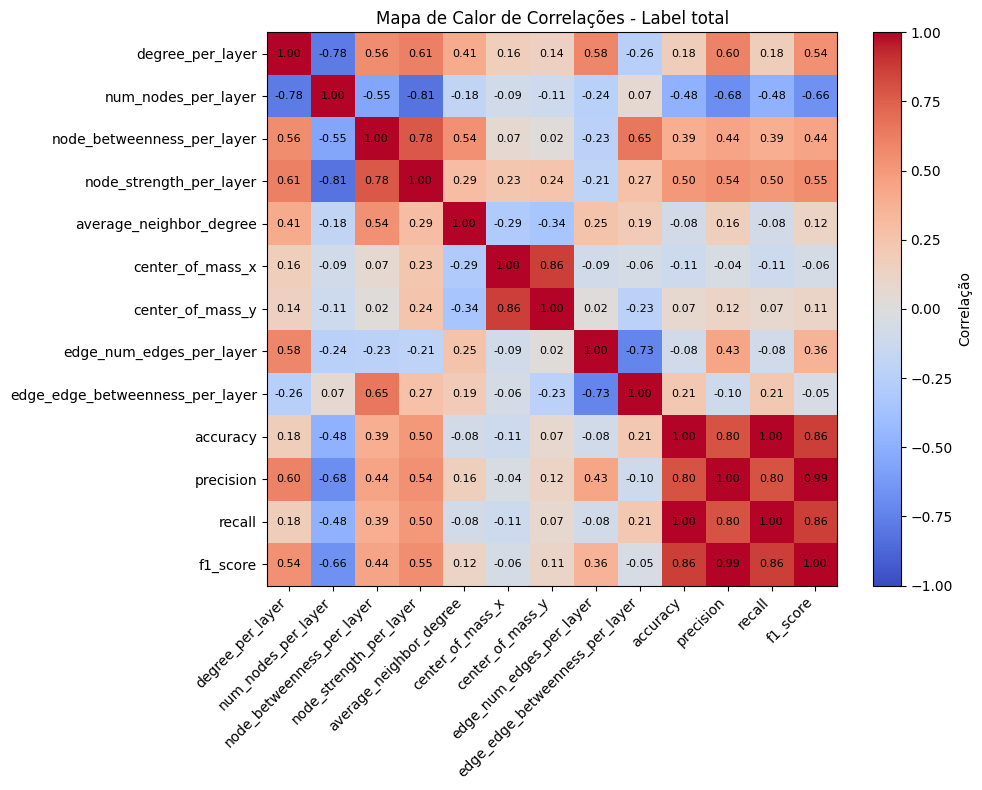

Carregando rótulos do dataset: sentence_length


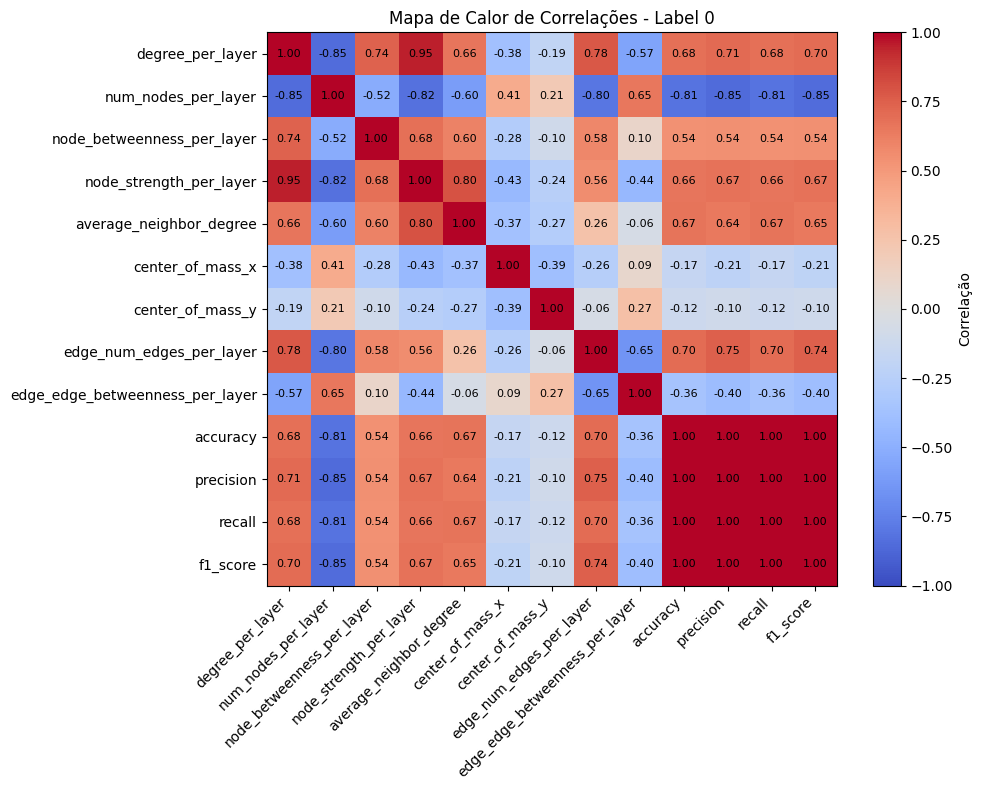

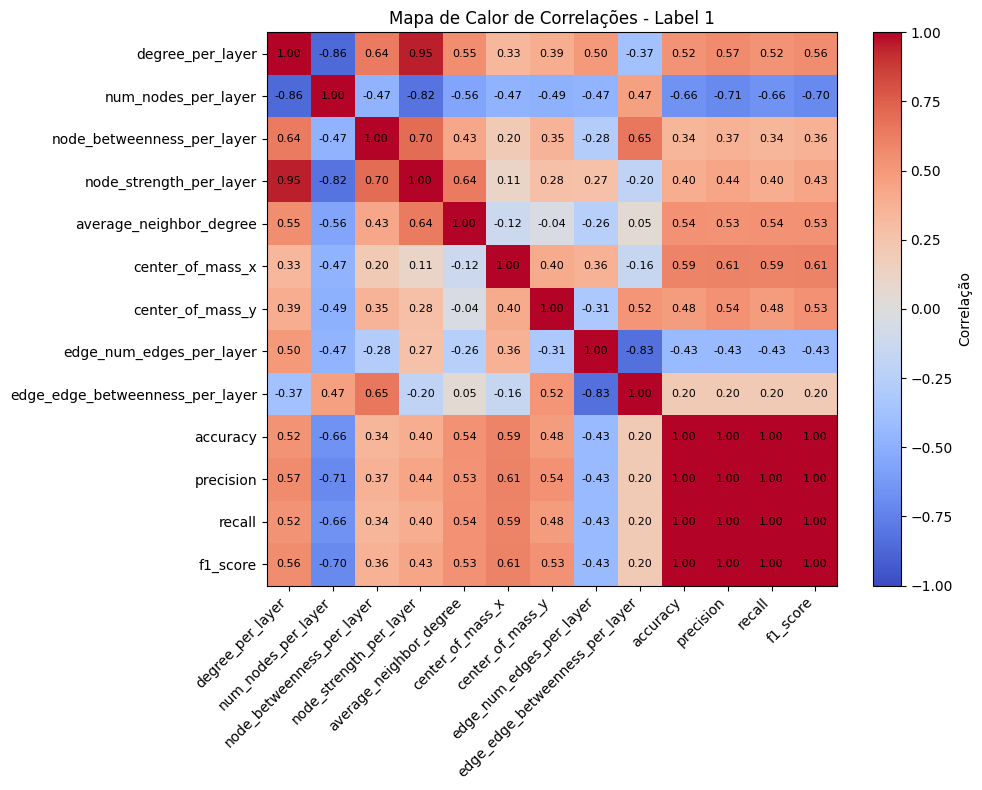

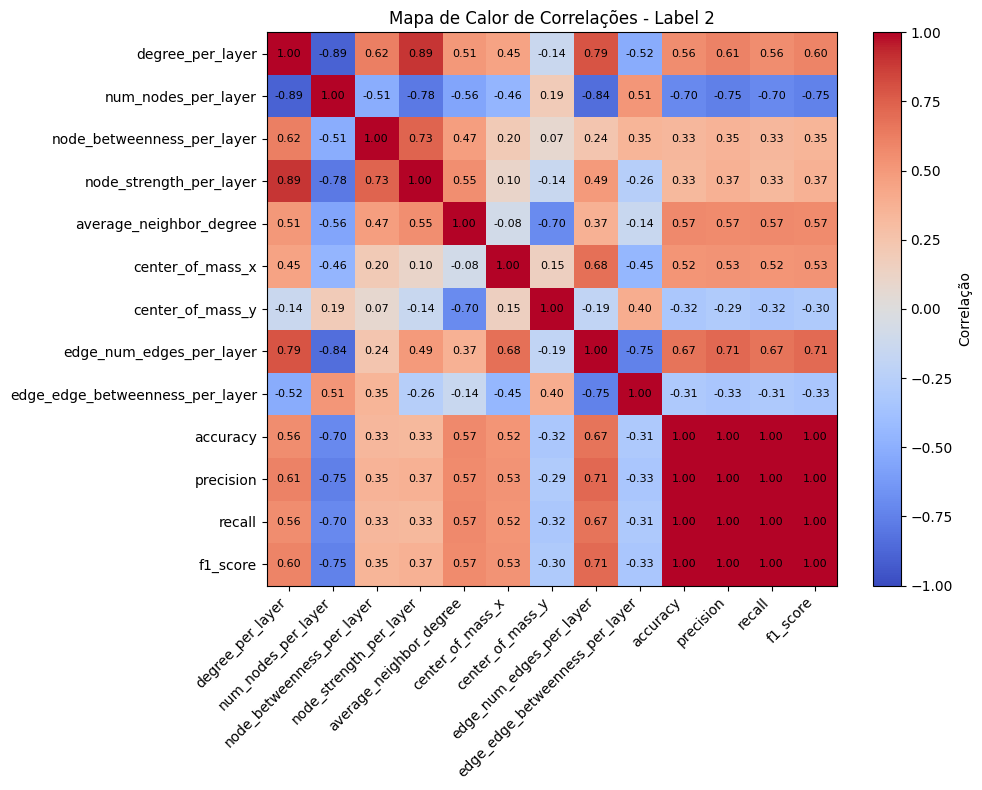

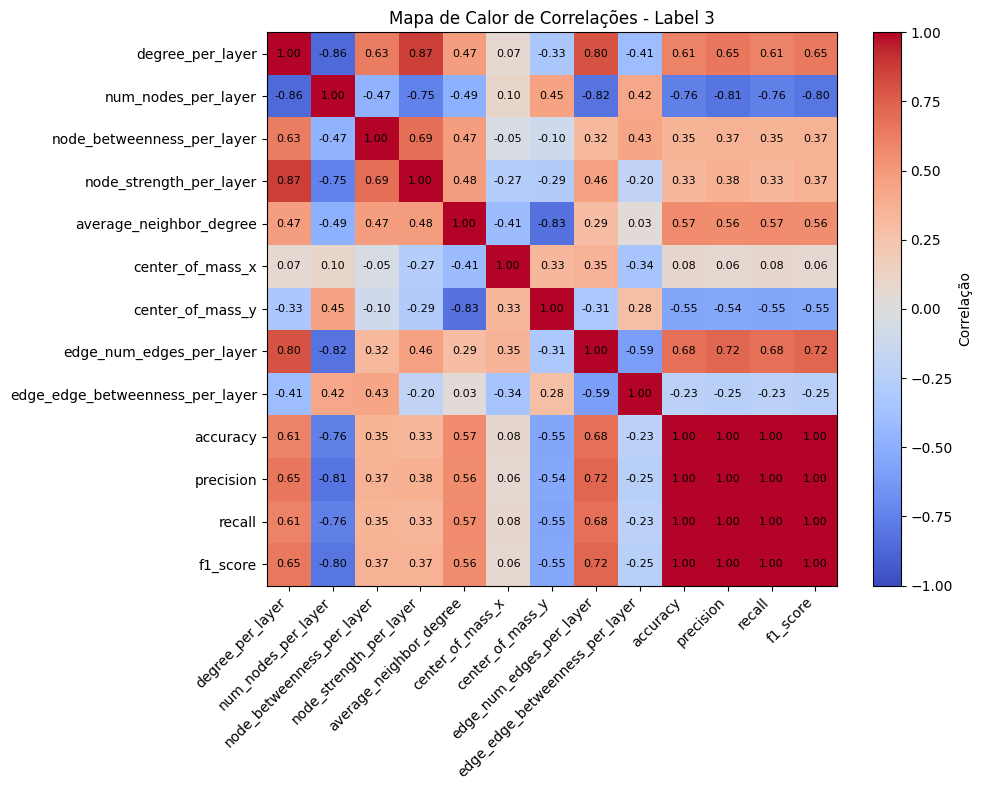

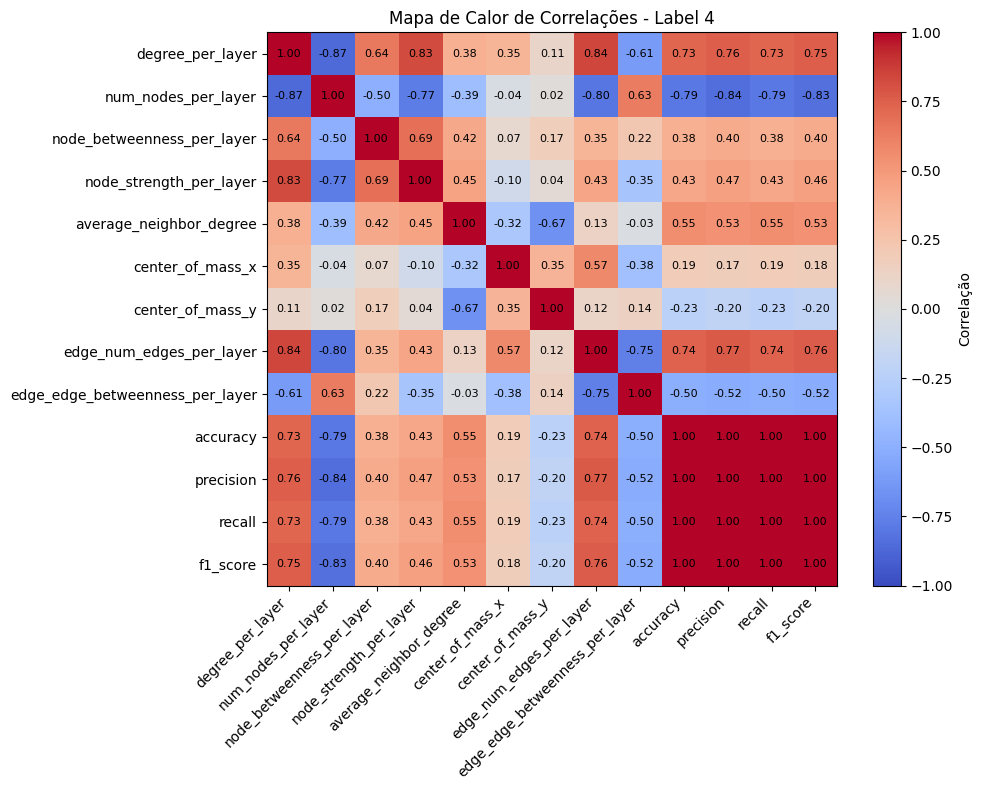

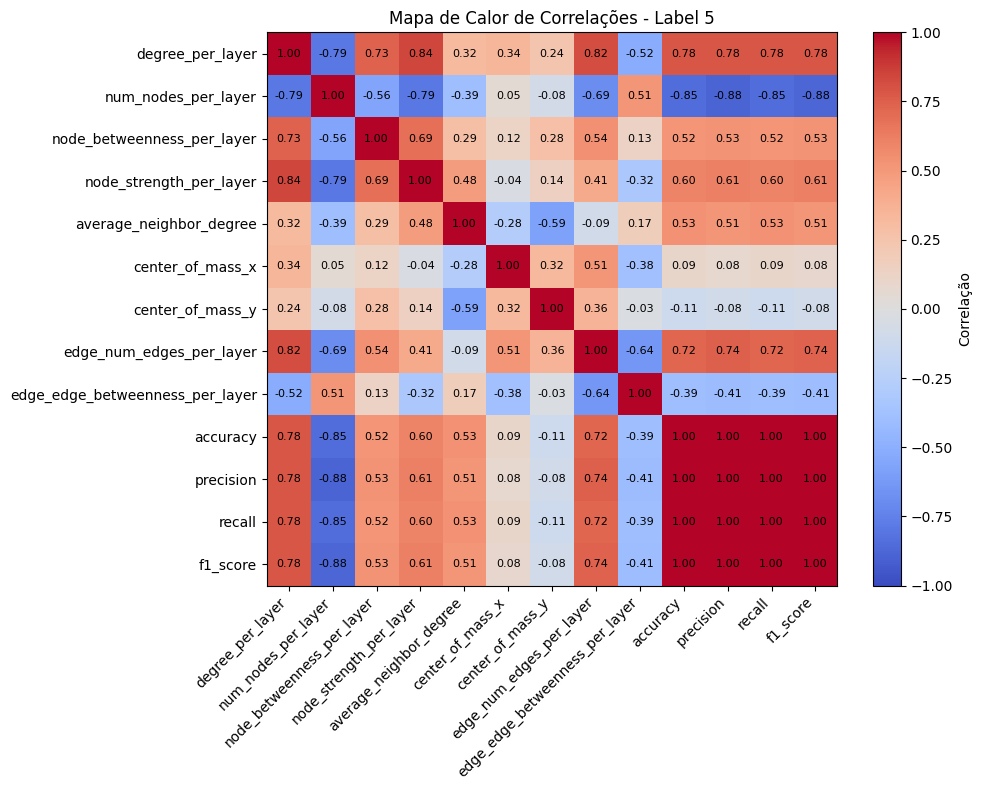

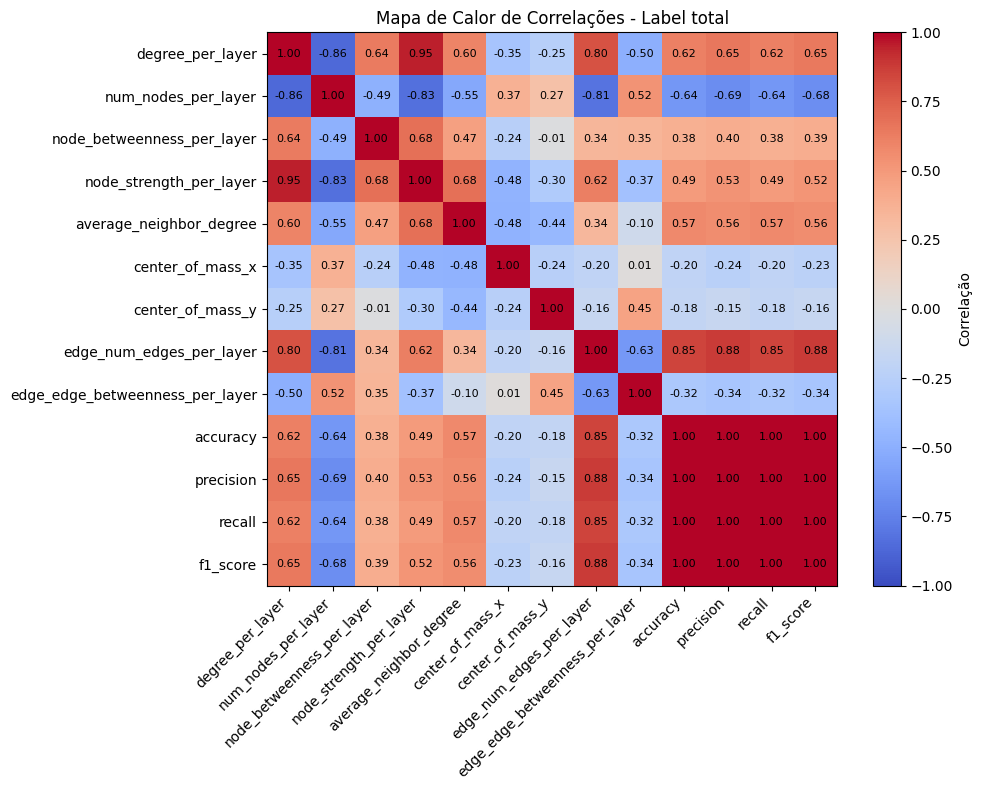

In [20]:
labels_dict = {
   "bigram_shift": ['I', 'O', 'total'],
   "odd_man_out": ["C", "O", "total"],
   "sentence_length": ["0", "1", "2", "3", "4", "5", "total"]
}

for dataset_name in DATASETS_NAMES:
    print("====================================================")
    print(f"Carregando rótulos do dataset: {dataset_name}")
    print("====================================================")

    for label in labels_dict[dataset_name]:
        df_metrics = pd.read_csv(f'{PROCESSED_DATASET_PATH}/metrics_per_layer_{dataset_name}_{label}.csv')
        df_probing = pd.read_csv(f'{PROCESSED_DATASET_PATH}/probing_{dataset_name}_results.csv')

        # Merge dos DataFrames com base na coluna 'layer'
        df_merged = pd.merge(df_metrics, df_probing[['layer', 'accuracy','precision','recall','f1_score']], on='layer', how='inner')
        df_merged = df_merged.drop('layer', axis=1)

        # Calcular correlações e gerar mapa de calor
        correlation_matrix = df_merged.corr(numeric_only=True)
        
        plt.figure(figsize=(10, 8))
        plt.imshow(correlation_matrix, cmap='coolwarm', aspect='auto', vmin=-1, vmax=1)
        plt.colorbar(label='Correlação')
        plt.xticks(range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=45, ha='right')
        plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
        
        # Adicionar valores de correlação dentro das células
        for i in range(len(correlation_matrix.columns)):
          for j in range(len(correlation_matrix.columns)):
            plt.text(j, i, f'{correlation_matrix.iloc[i, j]:.2f}',
                ha='center', va='center', color='black', fontsize=8)
        
        plt.title(f'Mapa de Calor de Correlações - Label {label}')
        plt.tight_layout()
        plt.show()


Métricas com melhores valores de correlação:
* BShift:  
None betweenness, degree

* odd_man_out:  
degree, nun nodes layer (-), força do nó


* sentence_length:  
num de nodes per layer (-),  num de edges, degree

1. Acurácia (Accuracy)É a métrica mais simples: de tudo o que o probe analisou, quanto ele acertou no total (tanto originais quanto invertidos).Fórmula:$$\text{Acurácia} = \frac{VP + VN}{\text{Total}}$$O Problema: Se você tiver 90% de frases originais e apenas 10% invertidas, um modelo que simplesmente chute "Original" para todas terá 90% de acurácia, mas será um modelo inútil para detectar inversões.  

2. Precisão (Precision)Foca na qualidade do alerta positivo. Quando o seu probe diz "esta frase está invertida", o quanto podemos confiar nele?Fórmula:$$\text{Precisão} = \frac{VP}{VP + FP}$$Na prática: Se a precisão for baixa, o probe está dando muitos "alarmes falsos" (dizendo que frases normais estão invertidas).  

3. Recall (Revocação ou Sensibilidade)Foca na abrangência. De todas as frases que estavam realmente invertidas no dataset, quantas o probe conseguiu encontrar?Fórmula:$$\text{Recall} = \frac{VP}{VP + FN}$$Na prática: Se o recall for baixo, o probe está deixando passar muitas frases invertidas sem perceber (muitas omissões).  

4. F1-ScoreO F1-Score é a média harmônica entre a Precisão e o Recall. Ele é a métrica ideal quando você quer um equilíbrio entre não dar alarmes falsos e não deixar passar nada.Fórmula:$$F1 = 2 \cdot \frac{\text{Precisão} \cdot \text{Recall}}{\text{Precisão} + \text{Recall}}$$Por que usar? É a melhor métrica para resumir o desempenho em uma única nota, especialmente se o seu dataset de frases estiver desbalanceado.

# Probing using Metrics

Não parece fazer sentido, pois tenho as metricas por camada. Para o dataset A, categoria X, tenho o número de nós para cada camada. No total tenho menos de 10 metricas por camada, contra 10_000 entradas para usar no probing.  
> Antes de irmos para o código, há um detalhe conceitual muito importante para o probing:
Para treinar o LogisticRegression, nós precisamos que essas métricas sejam extraídas para cada frase individualmente, e não agregadas por classe (como o nome _I.csv sugere, podendo indicar a classe "Inverted").  

_Para o probing precido de metricas "1 para 1" com as frases de entrada_